In [ ]:
#MelGAN-VC: Voice Conversion and Audio Style Transfer on arbitrarily long samples using Spectrograms
#Traditional voice conversion methods rely on parallel recordings of multiple speakers pronouncing the same sentences. For real-world applications however, parallel data is rarely available. We propose MelGAN-VC, a voice conversion method that relies on non-parallel speech data and is able to convert audio signals of arbitrary length from a source voice to a target voice. We firstly compute spectrograms from waveform data and then perform a domain translation using a Generative Adversarial Network (GAN) architecture. An additional siamese network helps preserving speech information in the translation process, without sacrificing the ability to flexibly model the style of the target speaker. We test our framework with a dataset of clean speech recordings, as well as with a collection of noisy real-world speech examples. Finally, we apply the same method to perform music style transfer, translating arbitrarily long music samples from one genre to another, and showing that our framework is flexible and can be used for audio manipulation applications different from voice conversion.




#We'll be using TF 2.1 and torchaudio

try:
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf
!pip install soundfile                    #to save wav files
!pip install --no-deps torchaudio==0.5.0

     |████████████████████████████████| 3.2MB 5.8MB/s 


In [ ]:
#Connecting Drive to save model checkpoints during training and to use custom data, uncomment if needed

# import os
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
#Dataset download (Uncomment where needed)

#Arctic dataset for voice conversion
!wget --header="Host: festvox.org" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/76.0.3809.100 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3" --header="Accept-Language: it-IT,it;q=0.9,en-US;q=0.8,en;q=0.7" --header="Referer: http://festvox.org/cmu_arctic/cmu_arctic/packed/" "http://festvox.org/cmu_arctic/cmu_arctic/packed/cmu_us_bdl_arctic-0.95-release.zip" -O "cmu_us_bdl_arctic-0.95-release.zip" -c
!unzip -qq cmu_us_bdl_arctic-0.95-release.zip #MALE1
!wget --header="Host: festvox.org" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/76.0.3809.100 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3" --header="Accept-Language: it-IT,it;q=0.9,en-US;q=0.8,en;q=0.7" --header="Referer: http://festvox.org/cmu_arctic/cmu_arctic/packed/" "http://festvox.org/cmu_arctic/cmu_arctic/packed/cmu_us_clb_arctic-0.95-release.zip" -O "cmu_us_clb_arctic-0.95-release.zip" -c
!unzip -qq cmu_us_clb_arctic-0.95-release.zip #FEMALE1
!wget --header="Host: festvox.org" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/76.0.3809.100 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3" --header="Accept-Language: it-IT,it;q=0.9,en-US;q=0.8,en;q=0.7" --header="Referer: http://festvox.org/cmu_arctic/cmu_arctic/packed/" "http://festvox.org/cmu_arctic/cmu_arctic/packed/cmu_us_rms_arctic-0.95-release.zip" -O "cmu_us_rms_arctic-0.95-release.zip" -c
!unzip -qq cmu_us_rms_arctic-0.95-release.zip #MALE2
!wget --header="Host: festvox.org" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/76.0.3809.100 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3" --header="Accept-Language: it-IT,it;q=0.9,en-US;q=0.8,en;q=0.7" --header="Referer: http://festvox.org/cmu_arctic/cmu_arctic/packed/" "http://festvox.org/cmu_arctic/cmu_arctic/packed/cmu_us_slt_arctic-0.95-release.zip" -O "cmu_us_slt_arctic-0.95-release.zip" -c
!unzip -qq cmu_us_slt_arctic-0.95-release.zip #FEMALE2

#GTZAN dataset for music genre transfer
# !wget --header="Host: opihi.cs.uvic.ca" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/77.0.3865.90 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3" --header="Accept-Language: it-IT,it;q=0.9,en-US;q=0.8,en;q=0.7" --header="Referer: http://marsyas.info/downloads/datasets.html" "http://opihi.cs.uvic.ca/sound/genres.tar.gz" -O "genres.tar.gz" -c
# !tar -xzf genres.tar.gz

!ls

--2021-02-20 20:30:35--  http://festvox.org/cmu_arctic/cmu_arctic/packed/cmu_us_bdl_arctic-0.95-release.zip
Resolving festvox.org (festvox.org)... 199.4.150.154
Connecting to festvox.org (festvox.org)|199.4.150.154|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 108711968 (104M) [application/zip]
Saving to: ‘cmu_us_bdl_arctic-0.95-release.zip’

cmu_us_bdl_arctic-0 100%[===================>] 103.68M  18.1MB/s    in 12s     

2021-02-20 20:30:48 (8.55 MB/s) - ‘cmu_us_bdl_arctic-0.95-release.zip’ saved [108711968/108711968]

--2021-02-20 20:30:50--  http://festvox.org/cmu_arctic/cmu_arctic/packed/cmu_us_clb_arctic-0.95-release.zip
Resolving festvox.org (festvox.org)... 199.4.150.154
Connecting to festvox.org (festvox.org)|199.4.150.154|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 148300802 (141M) [application/zip]
Saving to: ‘cmu_us_clb_arctic-0.95-release.zip’

cmu_us_clb_arctic-0 100%[===================>] 141.43M  19.6MB/s    in 14s 

In [ ]:
#Imports

from __future__ import print_function, division
from glob import glob
import scipy
import soundfile as sf
import matplotlib.pyplot as plt
from IPython.display import clear_output
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Concatenate, Conv2D, Conv2DTranspose, GlobalAveragePooling2D, UpSampling2D, LeakyReLU, ReLU, Add, Multiply, Lambda, Dot, BatchNormalization, Activation, ZeroPadding2D, Cropping2D, Cropping1D
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import TruncatedNormal, he_normal
import tensorflow.keras.backend as K
import datetime
import numpy as np
import random
import matplotlib.pyplot as plt
import collections
from PIL import Image
from skimage.transform import resize
import imageio
import librosa
import librosa.display
from librosa.feature import melspectrogram
import os
import time
import IPython

In [ ]:
#Hyperparameters

hop=192               #hop size (window size = 6*hop)
sr=16000              #sampling rate
min_level_db=-100     #reference values to normalize data
ref_level_db=20

shape=24              #length of time axis of split specrograms to feed to generator            
vec_len=128           #length of vector generated by siamese vector
bs = 16               #batch size
delta = 2.            #constant for siamese loss

In [ ]:
#There seems to be a problem with Tensorflow STFT, so we'll be using pytorch to handle offline mel-spectrogram generation and waveform reconstruction
#For waveform reconstruction, a gradient-based method is used:

''' Decorsière, Rémi, Peter L. Søndergaard, Ewen N. MacDonald, and Torsten Dau. 
"Inversion of auditory spectrograms, traditional spectrograms, and other envelope representations." 
IEEE/ACM Transactions on Audio, Speech, and Language Processing 23, no. 1 (2014): 46-56.'''

#ORIGINAL CODE FROM https://github.com/yoyololicon/spectrogram-inversion

import torch
import torch.nn as nn
import torch.nn.functional as F
from tqdm import tqdm
from functools import partial
import math
import heapq
from torchaudio.transforms import MelScale, Spectrogram

torch.set_default_tensor_type('torch.cuda.FloatTensor')

specobj = Spectrogram(n_fft=6*hop, win_length=6*hop, hop_length=hop, pad=0, power=2, normalized=True)
specfunc = specobj.forward
melobj = MelScale(n_mels=hop, sample_rate=sr, f_min=0.)
melfunc = melobj.forward

def melspecfunc(waveform):
  specgram = specfunc(waveform)
  mel_specgram = melfunc(specgram)
  return mel_specgram

def spectral_convergence(input, target):
    return 20 * ((input - target).norm().log10() - target.norm().log10())

def GRAD(spec, transform_fn, samples=None, init_x0=None, maxiter=1000, tol=1e-6, verbose=1, evaiter=10, lr=0.003):

    spec = torch.Tensor(spec)
    samples = (spec.shape[-1]*hop)-hop

    if init_x0 is None:
        init_x0 = spec.new_empty((1,samples)).normal_(std=1e-6)
    x = nn.Parameter(init_x0)
    T = spec

    criterion = nn.L1Loss()
    optimizer = torch.optim.Adam([x], lr=lr)

    bar_dict = {}
    metric_func = spectral_convergence
    bar_dict['spectral_convergence'] = 0
    metric = 'spectral_convergence'

    init_loss = None
    with tqdm(total=maxiter, disable=not verbose) as pbar:
        for i in range(maxiter):
            optimizer.zero_grad()
            V = transform_fn(x)
            loss = criterion(V, T)
            loss.backward()
            optimizer.step()
            lr = lr*0.9999
            for param_group in optimizer.param_groups:
              param_group['lr'] = lr

            if i % evaiter == evaiter - 1:
                with torch.no_grad():
                    V = transform_fn(x)
                    bar_dict[metric] = metric_func(V, spec).item()
                    l2_loss = criterion(V, spec).item()
                    pbar.set_postfix(**bar_dict, loss=l2_loss)
                    pbar.update(evaiter)

    return x.detach().view(-1).cpu()

def normalize(S):
  return np.clip((((S - min_level_db) / -min_level_db)*2.)-1., -1, 1)

def denormalize(S):
  return (((np.clip(S, -1, 1)+1.)/2.) * -min_level_db) + min_level_db

def prep(wv,hop=192):
  S = np.array(torch.squeeze(melspecfunc(torch.Tensor(wv).view(1,-1))).detach().cpu())
  S = librosa.power_to_db(S)-ref_level_db
  return normalize(S)

def deprep(S):
  S = denormalize(S)+ref_level_db
  S = librosa.db_to_power(S)
  wv = GRAD(np.expand_dims(S,0), melspecfunc, maxiter=2000, evaiter=10, tol=1e-8)
  return np.array(np.squeeze(wv))

In [ ]:
#Helper functions

#Generate spectrograms from waveform array
def tospec(data):
  specs=np.empty(data.shape[0], dtype=object)
  for i in range(data.shape[0]):
    x = data[i]
    S=prep(x)
    S = np.array(S, dtype=np.float32)
    specs[i]=np.expand_dims(S, -1)
  print(specs.shape)
  return specs

#Generate multiple spectrograms with a determined length from single wav file
def tospeclong(path, length=4*16000):
  x, sr = librosa.load(path,sr=16000)
  x,_ = librosa.effects.trim(x)
  loudls = librosa.effects.split(x, top_db=50)
  xls = np.array([])
  for interv in loudls:
    xls = np.concatenate((xls,x[interv[0]:interv[1]]))
  x = xls
  num = x.shape[0]//length
  specs=np.empty(num, dtype=object)
  for i in range(num-1):
    a = x[i*length:(i+1)*length]
    S = prep(a)
    S = np.array(S, dtype=np.float32)
    try:
      sh = S.shape
      specs[i]=S
    except AttributeError:
      print('spectrogram failed')
  print(specs.shape)
  return specs

#Waveform array from path of folder containing wav files
def audio_array(path):
  ls = glob(f'{path}/*.wav')
  adata = []
  for i in range(len(ls)):
    x, sr = tf.audio.decode_wav(tf.io.read_file(ls[i]), 1)
    x = np.array(x, dtype=np.float32)
    adata.append(x)
  return np.array(adata)

#Concatenate spectrograms in array along the time axis
def testass(a):
  but=False
  con = np.array([])
  nim = a.shape[0]
  for i in range(nim):
    im = a[i]
    im = np.squeeze(im)
    if not but:
      con=im
      but=True
    else:
      con = np.concatenate((con,im), axis=1)
  return np.squeeze(con)

#Split spectrograms in chunks with equal size
def splitcut(data):
  ls = []
  mini = 0
  minifinal = 10*shape                                                              #max spectrogram length
  for i in range(data.shape[0]-1):
    if data[i].shape[1]<=data[i+1].shape[1]:
      mini = data[i].shape[1]
    else:
      mini = data[i+1].shape[1]
    if mini>=3*shape and mini<minifinal:
      minifinal = mini
  for i in range(data.shape[0]):
    x = data[i]
    if x.shape[1]>=3*shape:
      for n in range(x.shape[1]//minifinal):
        ls.append(x[:,n*minifinal:n*minifinal+minifinal,:])
      ls.append(x[:,-minifinal:,:])
  return np.array(ls)

In [ ]:
#Generating Mel-Spectrogram dataset (Uncomment where needed)
#adata: source spectrograms
#bdata: target spectrograms

#MALE1
awv = audio_array('../content/cmu_us_clb_arctic/wav')                               #get waveform array from folder containing wav files
aspec = tospec(awv)                                                                 #get spectrogram array
adata = splitcut(aspec)                                                             #split spectrogams to fixed length
#FEMALE1
bwv = audio_array('../content/cmu_us_bdl_arctic/wav')
bspec = tospec(bwv)
bdata = splitcut(bspec)
# #MALE2
# awv = audio_array('../content/cmu_us_rms_arctic/wav')
# aspec = tospec(awv)
# adata = splitcut(aspec)
# #FEMALE2
# bwv = audio_array('../content/cmu_us_slt_arctic/wav')
# bspec = tospec(bwv)
# bdata = splitcut(bspec)

#JAZZ MUSIC
# awv = audio_array('../content/genres/jazz')
# aspec = tospec(awv)
# adata = splitcut(aspec)
#CLASSICAL MUSIC
# bwv = audio_array('../content/genres/classical')
# bspec = tospec(bwv)
# bdata = splitcut(bspec)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:45: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/usr/local/lib/python3.6/dist-packages/torch/functional.py:516: UserWarning: stft will require the return_complex parameter be explicitly  specified in a future PyTorch release. Use return_complex=False  to preserve the current behavior or return_complex=True to return  a complex output. (Triggered internally at  /pytorch/aten/src/ATen/native/SpectralOps.cpp:653.)
  normalized, onesided, return_complex)
/usr/local/lib/python3.6/dist-packages/torch/functional.py:516: UserWarning: The function torch.rfft is deprecated and will be removed in a future PyTorch release. Use the new torch.fft module functions, instead, by importing torch.fft and calling torch.fft.fft o

(1132,)
(1132,)


In [ ]:
#Creating Tensorflow Datasets

@tf.function
def proc(x):
  return tf.image.random_crop(x, size=[hop, 3*shape, 1])

dsa = tf.data.Dataset.from_tensor_slices(adata).repeat(50).map(proc, num_parallel_calls=tf.data.experimental.AUTOTUNE).shuffle(10000).batch(bs, drop_remainder=True)
dsb = tf.data.Dataset.from_tensor_slices(bdata).repeat(50).map(proc, num_parallel_calls=tf.data.experimental.AUTOTUNE).shuffle(10000).batch(bs, drop_remainder=True)

In [ ]:
#Adding Spectral Normalization to convolutional layers

from tensorflow.python.keras.utils import conv_utils
from tensorflow.python.ops import array_ops
from tensorflow.python.ops import math_ops
from tensorflow.python.ops import sparse_ops
from tensorflow.python.ops import gen_math_ops
from tensorflow.python.ops import standard_ops
from tensorflow.python.eager import context
from tensorflow.python.framework import tensor_shape

def l2normalize(v, eps=1e-12):
    return v / (tf.norm(v) + eps)


class ConvSN2D(tf.keras.layers.Conv2D):

    def __init__(self, filters, kernel_size, power_iterations=1, **kwargs):
        super(ConvSN2D, self).__init__(filters, kernel_size, **kwargs)
        self.power_iterations = power_iterations


    def build(self, input_shape):
        super(ConvSN2D, self).build(input_shape)

        if self.data_format == 'channels_first':
            channel_axis = 1
        else:
            channel_axis = -1

        self.u = self.add_weight(self.name + '_u',
            shape=tuple([1, self.kernel.shape.as_list()[-1]]), 
            initializer=tf.initializers.RandomNormal(0, 1),
            trainable=False
        )

    def compute_spectral_norm(self, W, new_u, W_shape):
        for _ in range(self.power_iterations):

            new_v = l2normalize(tf.matmul(new_u, tf.transpose(W)))
            new_u = l2normalize(tf.matmul(new_v, W))
            
        sigma = tf.matmul(tf.matmul(new_v, W), tf.transpose(new_u))
        W_bar = W/sigma

        with tf.control_dependencies([self.u.assign(new_u)]):
          W_bar = tf.reshape(W_bar, W_shape)

        return W_bar


    def call(self, inputs):
        W_shape = self.kernel.shape.as_list()
        W_reshaped = tf.reshape(self.kernel, (-1, W_shape[-1]))
        new_kernel = self.compute_spectral_norm(W_reshaped, self.u, W_shape)
        outputs = self._convolution_op(inputs, new_kernel)

        if self.use_bias:
            if self.data_format == 'channels_first':
                    outputs = tf.nn.bias_add(outputs, self.bias, data_format='NCHW')
            else:
                outputs = tf.nn.bias_add(outputs, self.bias, data_format='NHWC')
        if self.activation is not None:
            return self.activation(outputs)

        return outputs

class ConvSN2DTranspose(tf.keras.layers.Conv2DTranspose):

    def __init__(self, filters, kernel_size, power_iterations=1, **kwargs):
        super(ConvSN2DTranspose, self).__init__(filters, kernel_size, **kwargs)
        self.power_iterations = power_iterations


    def build(self, input_shape):
        super(ConvSN2DTranspose, self).build(input_shape)

        if self.data_format == 'channels_first':
            channel_axis = 1
        else:
            channel_axis = -1

        self.u = self.add_weight(self.name + '_u',
            shape=tuple([1, self.kernel.shape.as_list()[-1]]), 
            initializer=tf.initializers.RandomNormal(0, 1),
            trainable=False
        )

    def compute_spectral_norm(self, W, new_u, W_shape):
        for _ in range(self.power_iterations):

            new_v = l2normalize(tf.matmul(new_u, tf.transpose(W)))
            new_u = l2normalize(tf.matmul(new_v, W))
            
        sigma = tf.matmul(tf.matmul(new_v, W), tf.transpose(new_u))
        W_bar = W/sigma

        with tf.control_dependencies([self.u.assign(new_u)]):
          W_bar = tf.reshape(W_bar, W_shape)

        return W_bar

    def call(self, inputs):
        W_shape = self.kernel.shape.as_list()
        W_reshaped = tf.reshape(self.kernel, (-1, W_shape[-1]))
        new_kernel = self.compute_spectral_norm(W_reshaped, self.u, W_shape)

        inputs_shape = array_ops.shape(inputs)
        batch_size = inputs_shape[0]
        if self.data_format == 'channels_first':
          h_axis, w_axis = 2, 3
        else:
          h_axis, w_axis = 1, 2

        height, width = inputs_shape[h_axis], inputs_shape[w_axis]
        kernel_h, kernel_w = self.kernel_size
        stride_h, stride_w = self.strides

        if self.output_padding is None:
          out_pad_h = out_pad_w = None
        else:
          out_pad_h, out_pad_w = self.output_padding

        out_height = conv_utils.deconv_output_length(height,
                                                    kernel_h,
                                                    padding=self.padding,
                                                    output_padding=out_pad_h,
                                                    stride=stride_h,
                                                    dilation=self.dilation_rate[0])
        out_width = conv_utils.deconv_output_length(width,
                                                    kernel_w,
                                                    padding=self.padding,
                                                    output_padding=out_pad_w,
                                                    stride=stride_w,
                                                    dilation=self.dilation_rate[1])
        if self.data_format == 'channels_first':
          output_shape = (batch_size, self.filters, out_height, out_width)
        else:
          output_shape = (batch_size, out_height, out_width, self.filters)

        output_shape_tensor = array_ops.stack(output_shape)
        outputs = K.conv2d_transpose(
            inputs,
            new_kernel,
            output_shape_tensor,
            strides=self.strides,
            padding=self.padding,
            data_format=self.data_format,
            dilation_rate=self.dilation_rate)

        if not context.executing_eagerly():
          out_shape = self.compute_output_shape(inputs.shape)
          outputs.set_shape(out_shape)

        if self.use_bias:
          outputs = tf.nn.bias_add(
              outputs,
              self.bias,
              data_format=conv_utils.convert_data_format(self.data_format, ndim=4))

        if self.activation is not None:
          return self.activation(outputs)
        return outputs  

class DenseSN(Dense):
    def build(self, input_shape):
        super(DenseSN, self).build(input_shape)

        self.u = self.add_weight(self.name + '_u',
            shape=tuple([1, self.kernel.shape.as_list()[-1]]), 
            initializer=tf.initializers.RandomNormal(0, 1),
            trainable=False)
        
    def compute_spectral_norm(self, W, new_u, W_shape):
        new_v = l2normalize(tf.matmul(new_u, tf.transpose(W)))
        new_u = l2normalize(tf.matmul(new_v, W))
        sigma = tf.matmul(tf.matmul(new_v, W), tf.transpose(new_u))
        W_bar = W/sigma
        with tf.control_dependencies([self.u.assign(new_u)]):
          W_bar = tf.reshape(W_bar, W_shape)
        return W_bar
        
    def call(self, inputs):
        W_shape = self.kernel.shape.as_list()
        W_reshaped = tf.reshape(self.kernel, (-1, W_shape[-1]))
        new_kernel = self.compute_spectral_norm(W_reshaped, self.u, W_shape)
        rank = len(inputs.shape)
        if rank > 2:
          outputs = standard_ops.tensordot(inputs, new_kernel, [[rank - 1], [0]])
          if not context.executing_eagerly():
            shape = inputs.shape.as_list()
            output_shape = shape[:-1] + [self.units]
            outputs.set_shape(output_shape)
        else:
          inputs = math_ops.cast(inputs, self._compute_dtype)
          if K.is_sparse(inputs):
            outputs = sparse_ops.sparse_tensor_dense_matmul(inputs, new_kernel)
          else:
            outputs = gen_math_ops.mat_mul(inputs, new_kernel)
        if self.use_bias:
          outputs = tf.nn.bias_add(outputs, self.bias)
        if self.activation is not None:
          return self.activation(outputs)
        return outputs


In [ ]:
#Networks Architecture

init = tf.keras.initializers.he_uniform()

def conv2d(layer_input, filters, kernel_size=4, strides=2, padding='same', leaky=True, bnorm=True, sn=True):
  if leaky:
    Activ = LeakyReLU(alpha=0.2)
  else:
    Activ = ReLU()
  if sn:
    d = ConvSN2D(filters, kernel_size=kernel_size, strides=strides, padding=padding, kernel_initializer=init, use_bias=False)(layer_input)
  else:
    d = Conv2D(filters, kernel_size=kernel_size, strides=strides, padding=padding, kernel_initializer=init, use_bias=False)(layer_input)
  if bnorm:
    d = BatchNormalization()(d)
  d = Activ(d)
  return d

def deconv2d(layer_input, layer_res, filters, kernel_size=4, conc=True, scalev=False, bnorm=True, up=True, padding='same', strides=2):
  if up:
    u = UpSampling2D((1,2))(layer_input)
    u = ConvSN2D(filters, kernel_size, strides=(1,1), kernel_initializer=init, use_bias=False, padding=padding)(u)
  else:
    u = ConvSN2DTranspose(filters, kernel_size, strides=strides, kernel_initializer=init, use_bias=False, padding=padding)(layer_input)
  if bnorm:
    u = BatchNormalization()(u)
  u = LeakyReLU(alpha=0.2)(u)
  if conc:
    u = Concatenate()([u,layer_res])
  return u

#Extract function: splitting spectrograms
def extract_image(im):
  im1 = Cropping2D(((0,0), (0, 2*(im.shape[2]//3))))(im)
  im2 = Cropping2D(((0,0), (im.shape[2]//3,im.shape[2]//3)))(im)
  im3 = Cropping2D(((0,0), (2*(im.shape[2]//3), 0)))(im)
  return im1,im2,im3

#Assemble function: concatenating spectrograms
def assemble_image(lsim):
  im1,im2,im3 = lsim
  imh = Concatenate(2)([im1,im2,im3])
  return imh

#U-NET style architecture
def build_generator(input_shape):
  h,w,c = input_shape
  inp = Input(shape=input_shape)
  #downscaling
  g0 = tf.keras.layers.ZeroPadding2D((0,1))(inp)
  g1 = conv2d(g0, 256, kernel_size=(h,3), strides=1, padding='valid')
  g2 = conv2d(g1, 256, kernel_size=(1,9), strides=(1,2))
  g3 = conv2d(g2, 256, kernel_size=(1,7), strides=(1,2))
  #upscaling
  g4 = deconv2d(g3,g2, 256, kernel_size=(1,7), strides=(1,2))
  g5 = deconv2d(g4,g1, 256, kernel_size=(1,9), strides=(1,2), bnorm=False)
  g6 = ConvSN2DTranspose(1, kernel_size=(h,1), strides=(1,1), kernel_initializer=init, padding='valid', activation='tanh')(g5)
  return Model(inp,g6, name='G')

#Siamese Network
def build_siamese(input_shape):
  h,w,c = input_shape
  inp = Input(shape=input_shape)
  g1 = conv2d(inp, 256, kernel_size=(h,3), strides=1, padding='valid', sn=False)
  g2 = conv2d(g1, 256, kernel_size=(1,9), strides=(1,2), sn=False)
  g3 = conv2d(g2, 256, kernel_size=(1,7), strides=(1,2), sn=False)
  g4 = Flatten()(g3)
  g5 = Dense(vec_len)(g4)
  return Model(inp, g5, name='S')

#Discriminator (Critic) Network
def build_critic(input_shape):
  h,w,c = input_shape
  inp = Input(shape=input_shape)
  g1 = conv2d(inp, 512, kernel_size=(h,3), strides=1, padding='valid', bnorm=False)
  g2 = conv2d(g1, 512, kernel_size=(1,9), strides=(1,2), bnorm=False)
  g3 = conv2d(g2, 512, kernel_size=(1,7), strides=(1,2), bnorm=False)
  g4 = Flatten()(g3)
  g4 = DenseSN(1, kernel_initializer=init)(g4)
  return Model(inp, g4, name='C')

In [ ]:
#Load past models from path to resume training or test
def load(path):
  gen = build_generator((hop,shape,1))
  siam = build_siamese((hop,shape,1))
  critic = build_critic((hop,3*shape,1))
  gen.load_weights(path+'/gen.h5')
  critic.load_weights(path+'/critic.h5')
  siam.load_weights(path+'/siam.h5')
  return gen,critic,siam

#Build models
def build():
  gen = build_generator((hop,shape,1))
  siam = build_siamese((hop,shape,1))
  critic = build_critic((hop,3*shape,1))                                          #the discriminator accepts as input spectrograms of triple the width of those generated by the generator
  return gen,critic,siam

#Generate a random batch to display current training results
def testgena():
  sw = True
  while sw:
    a = np.random.choice(aspec)
    if a.shape[1]//shape!=1:
      sw=False
  dsa = []
  if a.shape[1]//shape>6:
    num=6
  else:
    num=a.shape[1]//shape
  rn = np.random.randint(a.shape[1]-(num*shape))
  for i in range(num):
    im = a[:,rn+(i*shape):rn+(i*shape)+shape]
    im = np.reshape(im, (im.shape[0],im.shape[1],1))
    dsa.append(im)
  return np.array(dsa, dtype=np.float32)

#Show results mid-training
def save_test_image_full(path):
  a = testgena()
  print(a.shape)
  ab = gen(a, training=False)
  ab = testass(ab)
  a = testass(a)
  abwv = deprep(ab)
  awv = deprep(a)
  sf.write(path+'/new_file.wav', abwv, sr)
  IPython.display.display(IPython.display.Audio(np.squeeze(abwv), rate=sr))
  IPython.display.display(IPython.display.Audio(np.squeeze(awv), rate=sr))
  fig, axs = plt.subplots(ncols=2)
  axs[0].imshow(np.flip(a, -2), cmap=None)
  axs[0].axis('off')
  axs[0].set_title('Source')
  axs[1].imshow(np.flip(ab, -2), cmap=None)
  axs[1].axis('off')
  axs[1].set_title('Generated')
  plt.show()

#Save in training loop
def save_end(epoch,gloss,closs,mloss,n_save=3,save_path='../content/'):                 #use custom save_path (i.e. Drive '../content/drive/My Drive/')
  if epoch % n_save == 0:
    print('Saving...')
    path = f'{save_path}/MELGANVC-{str(gloss)[:9]}-{str(closs)[:9]}-{str(mloss)[:9]}'
    os.mkdir(path)
    gen.save_weights(path+'/gen.h5')
    critic.save_weights(path+'/critic.h5')
    siam.save_weights(path+'/siam.h5')
    save_test_image_full(path)

In [ ]:
#Losses

def mae(x,y):
  return tf.reduce_mean(tf.abs(x-y))

def mse(x,y):
  return tf.reduce_mean((x-y)**2)

def loss_travel(sa,sab,sa1,sab1):
  l1 = tf.reduce_mean(((sa-sa1) - (sab-sab1))**2)
  l2 = tf.reduce_mean(tf.reduce_sum(-(tf.nn.l2_normalize(sa-sa1, axis=[-1]) * tf.nn.l2_normalize(sab-sab1, axis=[-1])), axis=-1))
  return l1+l2

def loss_siamese(sa,sa1):
  logits = tf.sqrt(tf.reduce_sum((sa-sa1)**2, axis=-1, keepdims=True))
  return tf.reduce_mean(tf.square(tf.maximum((delta - logits), 0)))

def d_loss_f(fake):
  return tf.reduce_mean(tf.maximum(1 + fake, 0))

def d_loss_r(real):
  return tf.reduce_mean(tf.maximum(1 - real, 0))

def g_loss_f(fake):
  return tf.reduce_mean(- fake)

In [ ]:
#Get models and optimizers
def get_networks(shape, load_model=False, path=None):
  if not load_model:
    gen,critic,siam = build()
  else:
    gen,critic,siam = load(path)
  print('Built networks')

  opt_gen = Adam(0.0001, 0.5)
  opt_disc = Adam(0.0001, 0.5)

  return gen,critic,siam, [opt_gen,opt_disc]

#Set learning rate
def update_lr(lr):
  opt_gen.learning_rate = lr
  opt_disc.learning_rate = lr

In [ ]:
#Training Functions

#Train Generator, Siamese and Critic
@tf.function
def train_all(a,b):
  #splitting spectrogram in 3 parts
  aa,aa2,aa3 = extract_image(a) 
  bb,bb2,bb3 = extract_image(b)

  with tf.GradientTape() as tape_gen, tf.GradientTape() as tape_disc:

    #translating A to B
    fab = gen(aa, training=True)
    fab2 = gen(aa2, training=True)
    fab3 = gen(aa3, training=True)
    #identity mapping B to B                                                        COMMENT THESE 3 LINES IF THE IDENTITY LOSS TERM IS NOT NEEDED
    fid = gen(bb, training=True) 
    fid2 = gen(bb2, training=True)
    fid3 = gen(bb3, training=True)
    #concatenate/assemble converted spectrograms
    fabtot = assemble_image([fab,fab2,fab3])

    #feed concatenated spectrograms to critic
    cab = critic(fabtot, training=True)
    cb = critic(b, training=True)
    #feed 2 pairs (A,G(A)) extracted spectrograms to Siamese
    sab = siam(fab, training=True)
    sab2 = siam(fab3, training=True)
    sa = siam(aa, training=True)
    sa2 = siam(aa3, training=True)

    #identity mapping loss
    loss_id = (mae(bb,fid)+mae(bb2,fid2)+mae(bb3,fid3))/3.                         #loss_id = 0. IF THE IDENTITY LOSS TERM IS NOT NEEDED
    #travel loss
    loss_m = loss_travel(sa,sab,sa2,sab2)+loss_siamese(sa,sa2)
    #generator and critic losses
    loss_g = g_loss_f(cab)
    loss_dr = d_loss_r(cb)
    loss_df = d_loss_f(cab)
    loss_d = (loss_dr+loss_df)/2.
    #generator+siamese total loss
    lossgtot = loss_g+10.*loss_m+0.5*loss_id                                       #CHANGE LOSS WEIGHTS HERE  (COMMENT OUT +w*loss_id IF THE IDENTITY LOSS TERM IS NOT NEEDED)
  
  #computing and applying gradients
  grad_gen = tape_gen.gradient(lossgtot, gen.trainable_variables+siam.trainable_variables)
  opt_gen.apply_gradients(zip(grad_gen, gen.trainable_variables+siam.trainable_variables))

  grad_disc = tape_disc.gradient(loss_d, critic.trainable_variables)
  opt_disc.apply_gradients(zip(grad_disc, critic.trainable_variables))
  
  return loss_dr,loss_df,loss_g,loss_id

#Train Critic only
@tf.function
def train_d(a,b):
  aa,aa2,aa3 = extract_image(a)
  with tf.GradientTape() as tape_disc:

    fab = gen(aa, training=True)
    fab2 = gen(aa2, training=True)
    fab3 = gen(aa3, training=True)
    fabtot = assemble_image([fab,fab2,fab3])

    cab = critic(fabtot, training=True)
    cb = critic(b, training=True)

    loss_dr = d_loss_r(cb)
    loss_df = d_loss_f(cab)

    loss_d = (loss_dr+loss_df)/2.
  
  grad_disc = tape_disc.gradient(loss_d, critic.trainable_variables)
  opt_disc.apply_gradients(zip(grad_disc, critic.trainable_variables))

  return loss_dr,loss_df

In [ ]:
#Training Loop

def train(epochs, batch_size=16, lr=0.0001, n_save=6, gupt=5):
  
  update_lr(lr)
  df_list = []
  dr_list = []
  g_list = []
  id_list = []
  c = 0
  g = 0
  
  for epoch in range(epochs):
        bef = time.time()
        
        for batchi,(a,b) in enumerate(zip(dsa,dsb)):
          
            if batchi%gupt==0:
              dloss_t,dloss_f,gloss,idloss = train_all(a,b)
            else:
              dloss_t,dloss_f = train_d(a,b)

            df_list.append(dloss_f)
            dr_list.append(dloss_t)
            g_list.append(gloss)
            id_list.append(idloss)
            c += 1
            g += 1

            if batchi%600==0:
                print(f'[Epoch {epoch}/{epochs}] [Batch {batchi}] [D loss f: {np.mean(df_list[-g:], axis=0)} ', end='')
                print(f'r: {np.mean(dr_list[-g:], axis=0)}] ', end='')
                print(f'[G loss: {np.mean(g_list[-g:], axis=0)}] ', end='')
                print(f'[ID loss: {np.mean(id_list[-g:])}] ', end='')
                print(f'[LR: {lr}]')
                g = 0
            nbatch=batchi

        print(f'Time/Batch {(time.time()-bef)/nbatch}')
        save_end(epoch,np.mean(g_list[-n_save*c:], axis=0),np.mean(df_list[-n_save*c:], axis=0),np.mean(id_list[-n_save*c:], axis=0),n_save=n_save)
        print(f'Mean D loss: {np.mean(df_list[-c:], axis=0)} Mean G loss: {np.mean(g_list[-c:], axis=0)} Mean ID loss: {np.mean(id_list[-c:], axis=0)}')
        c = 0
                      

In [ ]:
#Build models and initialize optimizers

#If load_model=True, specify the path where the models are saved

gen,critic,siam, [opt_gen,opt_disc] = get_networks(shape, load_model=False, path='../content/drive/My Drive/')

Built networks


[Epoch 0/50] [Batch 0] [D loss f: 0.3027191758155823 r: 0.020153921097517014] [G loss: 0.795335054397583] [ID loss: 0.15483218431472778] [LR: 0.0002]
[Epoch 0/50] [Batch 600] [D loss f: 0.2282247096300125 r: 0.1716078519821167] [G loss: 1.5916565656661987] [ID loss: 0.14987429976463318] [LR: 0.0002]
[Epoch 0/50] [Batch 1200] [D loss f: 0.1958952397108078 r: 0.13835245370864868] [G loss: 1.3544358015060425] [ID loss: 0.1511419266462326] [LR: 0.0002]
[Epoch 0/50] [Batch 1800] [D loss f: 0.2236386090517044 r: 0.15695133805274963] [G loss: 1.257440209388733] [ID loss: 0.16234147548675537] [LR: 0.0002]
[Epoch 0/50] [Batch 2400] [D loss f: 0.2527807056903839 r: 0.15986956655979156] [G loss: 1.130544662475586] [ID loss: 0.1743272840976715] [LR: 0.0002]
[Epoch 0/50] [Batch 3000] [D loss f: 0.3018568456172943 r: 0.16798469424247742] [G loss: 1.0943892002105713] [ID loss: 0.18295131623744965] [LR: 0.0002]
[Epoch 0/50] [Batch 3600] [D loss f: 0.29733729362487793 r: 0.17238391935825348] [G loss: 0

100%|██████████| 2000/2000 [00:03<00:00, 650.58it/s, loss=0.000531, spectral_convergence=-40.4]


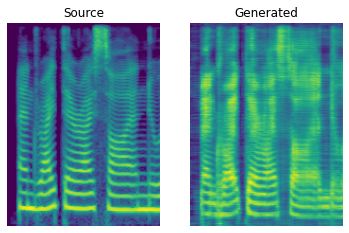

Mean D loss: 0.28051239252090454 Mean G loss: 1.0485628843307495 Mean ID loss: 0.17800989747047424
[Epoch 1/50] [Batch 0] [D loss f: 0.30524110794067383 r: 0.2236170470714569] [G loss: 1.0449877977371216] [ID loss: 0.14905238151550293] [LR: 0.0002]
[Epoch 1/50] [Batch 600] [D loss f: 0.32416832447052 r: 0.24508260190486908] [G loss: 0.9968560934066772] [ID loss: 0.14304232597351074] [LR: 0.0002]
[Epoch 1/50] [Batch 1200] [D loss f: 0.3248335123062134 r: 0.2819801867008209] [G loss: 0.9324509501457214] [ID loss: 0.13736873865127563] [LR: 0.0002]
[Epoch 1/50] [Batch 1800] [D loss f: 0.34748756885528564 r: 0.2848520576953888] [G loss: 0.9970052242279053] [ID loss: 0.13509750366210938] [LR: 0.0002]
[Epoch 1/50] [Batch 2400] [D loss f: 0.3623313307762146 r: 0.3243875205516815] [G loss: 1.0400422811508179] [ID loss: 0.13509206473827362] [LR: 0.0002]
[Epoch 1/50] [Batch 3000] [D loss f: 0.38693714141845703 r: 0.3349112570285797] [G loss: 1.0733530521392822] [ID loss: 0.1359904706478119] [LR: 

  5%|▌         | 100/2000 [00:00<00:03, 608.28it/s, loss=0.0147, spectral_convergence=-6.1]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 608.14it/s, loss=0.000711, spectral_convergence=-24.1]


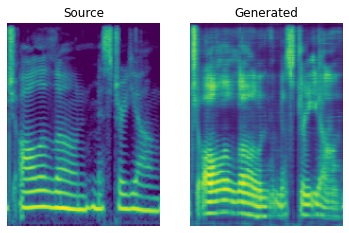

Mean D loss: 0.39841073751449585 Mean G loss: 0.9860484600067139 Mean ID loss: 0.14156726002693176
[Epoch 2/50] [Batch 0] [D loss f: 0.41963091492652893 r: 0.45122870802879333] [G loss: 0.988217294216156] [ID loss: 0.14670449495315552] [LR: 0.0002]
[Epoch 2/50] [Batch 600] [D loss f: 0.4325180649757385 r: 0.46551311016082764] [G loss: 0.863730788230896] [ID loss: 0.14669756591320038] [LR: 0.0002]
[Epoch 2/50] [Batch 1200] [D loss f: 0.43808960914611816 r: 0.4634934365749359] [G loss: 0.920433759689331] [ID loss: 0.1478126496076584] [LR: 0.0002]
[Epoch 2/50] [Batch 1800] [D loss f: 0.4300508499145508 r: 0.47334298491477966] [G loss: 0.9011839032173157] [ID loss: 0.14537590742111206] [LR: 0.0002]
[Epoch 2/50] [Batch 2400] [D loss f: 0.4313068091869354 r: 0.45976755023002625] [G loss: 0.8981619477272034] [ID loss: 0.14580950140953064] [LR: 0.0002]
[Epoch 2/50] [Batch 3000] [D loss f: 0.4356094300746918 r: 0.4673171043395996] [G loss: 0.8592801690101624] [ID loss: 0.14589861035346985] [LR:

  5%|▌         | 100/2000 [00:00<00:03, 611.23it/s, loss=0.0191, spectral_convergence=-6.4]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 599.26it/s, loss=0.000306, spectral_convergence=-46.1]


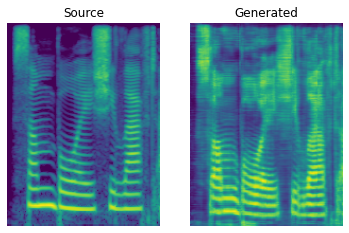

Mean D loss: 0.4355922341346741 Mean G loss: 0.8702372908592224 Mean ID loss: 0.14258083701133728
[Epoch 3/50] [Batch 0] [D loss f: 0.43835413455963135 r: 0.450035035610199] [G loss: 0.8529684543609619] [ID loss: 0.13919471204280853] [LR: 0.0002]
[Epoch 3/50] [Batch 600] [D loss f: 0.4561551809310913 r: 0.4626332223415375] [G loss: 0.8999312520027161] [ID loss: 0.13752828538417816] [LR: 0.0002]
[Epoch 3/50] [Batch 1200] [D loss f: 0.440032035112381 r: 0.4680311977863312] [G loss: 0.7945981025695801] [ID loss: 0.13719987869262695] [LR: 0.0002]
[Epoch 3/50] [Batch 1800] [D loss f: 0.445302277803421 r: 0.4829833507537842] [G loss: 0.7366652488708496] [ID loss: 0.13709121942520142] [LR: 0.0002]
[Epoch 3/50] [Batch 2400] [D loss f: 0.4460117220878601 r: 0.47745412588119507] [G loss: 0.7879477143287659] [ID loss: 0.13756945729255676] [LR: 0.0002]
[Epoch 3/50] [Batch 3000] [D loss f: 0.441277414560318 r: 0.47653675079345703] [G loss: 0.7360467314720154] [ID loss: 0.13741521537303925] [LR: 0.0

  4%|▍         | 90/2000 [00:00<00:03, 585.69it/s, loss=0.0064, spectral_convergence=-7.01] 

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 573.40it/s, loss=0.000663, spectral_convergence=-33.5]


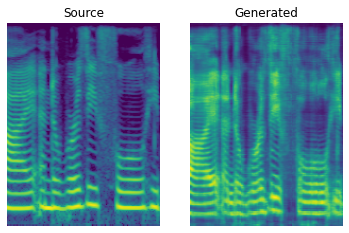

Mean D loss: 0.4593811631202698 Mean G loss: 0.7706763744354248 Mean ID loss: 0.1355832815170288
[Epoch 4/50] [Batch 0] [D loss f: 0.47575461864471436 r: 0.4800528585910797] [G loss: 0.7545282244682312] [ID loss: 0.13296787440776825] [LR: 0.0002]
[Epoch 4/50] [Batch 600] [D loss f: 0.47579097747802734 r: 0.48787689208984375] [G loss: 0.7456873655319214] [ID loss: 0.13366317749023438] [LR: 0.0002]
[Epoch 4/50] [Batch 1200] [D loss f: 0.46328166127204895 r: 0.4973294138908386] [G loss: 0.6565596461296082] [ID loss: 0.13433636724948883] [LR: 0.0002]
[Epoch 4/50] [Batch 1800] [D loss f: 0.48375070095062256 r: 0.4891047775745392] [G loss: 0.7544114589691162] [ID loss: 0.1339966058731079] [LR: 0.0002]
[Epoch 4/50] [Batch 2400] [D loss f: 0.4762836694717407 r: 0.4926289916038513] [G loss: 0.7415860295295715] [ID loss: 0.13313977420330048] [LR: 0.0002]
[Epoch 4/50] [Batch 3000] [D loss f: 0.48001575469970703 r: 0.4925045669078827] [G loss: 0.7140955328941345] [ID loss: 0.13308939337730408] [LR

  4%|▍         | 90/2000 [00:00<00:03, 578.02it/s, loss=0.00385, spectral_convergence=-8.85]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 584.92it/s, loss=0.000171, spectral_convergence=-44.7]


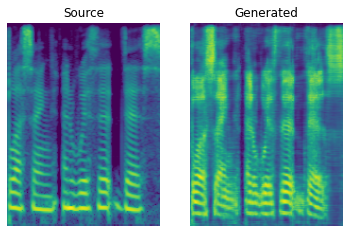

Mean D loss: 0.4869522750377655 Mean G loss: 0.7145000696182251 Mean ID loss: 0.13288618624210358
[Epoch 5/50] [Batch 0] [D loss f: 0.49354973435401917 r: 0.5041571259498596] [G loss: 0.7623792290687561] [ID loss: 0.13102932274341583] [LR: 0.0002]
[Epoch 5/50] [Batch 600] [D loss f: 0.49627554416656494 r: 0.5030798316001892] [G loss: 0.7032977342605591] [ID loss: 0.13164620101451874] [LR: 0.0002]
[Epoch 5/50] [Batch 1200] [D loss f: 0.4993640184402466 r: 0.5136296153068542] [G loss: 0.6950865387916565] [ID loss: 0.13156549632549286] [LR: 0.0002]
[Epoch 5/50] [Batch 1800] [D loss f: 0.5077069997787476 r: 0.5144678354263306] [G loss: 0.7361716032028198] [ID loss: 0.13078589737415314] [LR: 0.0002]
[Epoch 5/50] [Batch 2400] [D loss f: 0.49944499135017395 r: 0.511263906955719] [G loss: 0.6841901540756226] [ID loss: 0.13091318309307098] [LR: 0.0002]
[Epoch 5/50] [Batch 3000] [D loss f: 0.5017667412757874 r: 0.5029780268669128] [G loss: 0.7249338626861572] [ID loss: 0.13129712641239166] [LR: 

  4%|▍         | 90/2000 [00:00<00:03, 585.73it/s, loss=0.00488, spectral_convergence=-9.35]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 561.94it/s, loss=0.000402, spectral_convergence=-31.7]


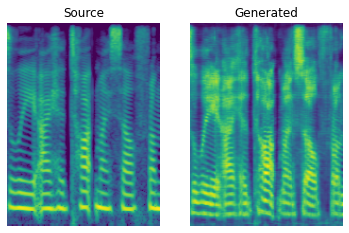

Mean D loss: 0.5014820694923401 Mean G loss: 0.6918128132820129 Mean ID loss: 0.13036896288394928
[Epoch 6/50] [Batch 0] [D loss f: 0.4988572597503662 r: 0.5240151286125183] [G loss: 0.707705557346344] [ID loss: 0.1299336552619934] [LR: 0.0002]
[Epoch 6/50] [Batch 600] [D loss f: 0.5040125250816345 r: 0.5255073308944702] [G loss: 0.6398308873176575] [ID loss: 0.12980817258358002] [LR: 0.0002]
[Epoch 6/50] [Batch 1200] [D loss f: 0.516068696975708 r: 0.5148387551307678] [G loss: 0.7331291437149048] [ID loss: 0.1297367960214615] [LR: 0.0002]
[Epoch 6/50] [Batch 1800] [D loss f: 0.5105277299880981 r: 0.5209209322929382] [G loss: 0.6969892382621765] [ID loss: 0.12842226028442383] [LR: 0.0002]
[Epoch 6/50] [Batch 2400] [D loss f: 0.5127958059310913 r: 0.5254469513893127] [G loss: 0.6417099833488464] [ID loss: 0.12874314188957214] [LR: 0.0002]
[Epoch 6/50] [Batch 3000] [D loss f: 0.5157146453857422 r: 0.5177374482154846] [G loss: 0.6552903652191162] [ID loss: 0.12884333729743958] [LR: 0.0002

  5%|▌         | 100/2000 [00:00<00:03, 623.06it/s, loss=0.00797, spectral_convergence=-8.1]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 578.65it/s, loss=0.000737, spectral_convergence=-28.9]


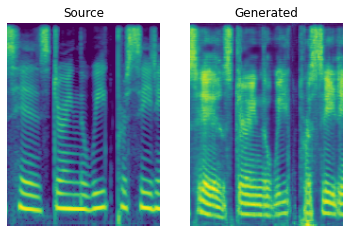

Mean D loss: 0.5120509266853333 Mean G loss: 0.6705306172370911 Mean ID loss: 0.12841665744781494
[Epoch 7/50] [Batch 0] [D loss f: 0.519636332988739 r: 0.5232057571411133] [G loss: 0.6774465441703796] [ID loss: 0.12693803012371063] [LR: 0.0002]
[Epoch 7/50] [Batch 600] [D loss f: 0.5129278898239136 r: 0.5353580117225647] [G loss: 0.6388620734214783] [ID loss: 0.1278887242078781] [LR: 0.0002]
[Epoch 7/50] [Batch 1200] [D loss f: 0.5261914730072021 r: 0.5226525068283081] [G loss: 0.6911683082580566] [ID loss: 0.12761588394641876] [LR: 0.0002]
[Epoch 7/50] [Batch 1800] [D loss f: 0.521597683429718 r: 0.5302785038948059] [G loss: 0.6671368479728699] [ID loss: 0.1280854046344757] [LR: 0.0002]
[Epoch 7/50] [Batch 2400] [D loss f: 0.5077708959579468 r: 0.5351356267929077] [G loss: 0.6437380909919739] [ID loss: 0.1270313709974289] [LR: 0.0002]
[Epoch 7/50] [Batch 3000] [D loss f: 0.5127789378166199 r: 0.531382143497467] [G loss: 0.65031498670578] [ID loss: 0.1270970106124878] [LR: 0.0002]
[Ep

  4%|▍         | 80/2000 [00:00<00:03, 522.67it/s, loss=0.033, spectral_convergence=-1.76] 

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 581.88it/s, loss=0.000281, spectral_convergence=-38.4]


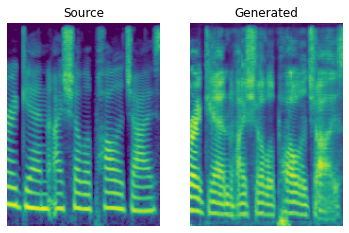

Mean D loss: 0.5208132266998291 Mean G loss: 0.6670576333999634 Mean ID loss: 0.1268010437488556
[Epoch 8/50] [Batch 0] [D loss f: 0.5091832876205444 r: 0.5413891077041626] [G loss: 0.6703452467918396] [ID loss: 0.12605232000350952] [LR: 0.0002]
[Epoch 8/50] [Batch 600] [D loss f: 0.5215986967086792 r: 0.5441344976425171] [G loss: 0.6588564515113831] [ID loss: 0.12597981095314026] [LR: 0.0002]
[Epoch 8/50] [Batch 1200] [D loss f: 0.5271152853965759 r: 0.5302337408065796] [G loss: 0.683987557888031] [ID loss: 0.12595807015895844] [LR: 0.0002]
[Epoch 8/50] [Batch 1800] [D loss f: 0.5259519219398499 r: 0.5394459962844849] [G loss: 0.6504453420639038] [ID loss: 0.12626157701015472] [LR: 0.0002]
[Epoch 8/50] [Batch 2400] [D loss f: 0.5159586668014526 r: 0.536005437374115] [G loss: 0.6649958491325378] [ID loss: 0.12695421278476715] [LR: 0.0002]
[Epoch 8/50] [Batch 3000] [D loss f: 0.5177037715911865 r: 0.5406333208084106] [G loss: 0.6424061059951782] [ID loss: 0.12611053884029388] [LR: 0.000

  4%|▍         | 90/2000 [00:00<00:03, 586.34it/s, loss=0.00818, spectral_convergence=-5.64]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 579.60it/s, loss=0.000341, spectral_convergence=-28.7]


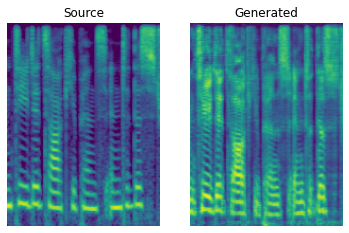

Mean D loss: 0.5249678492546082 Mean G loss: 0.6439418792724609 Mean ID loss: 0.1255662888288498
[Epoch 9/50] [Batch 0] [D loss f: 0.5279291868209839 r: 0.5538430213928223] [G loss: 0.6341508030891418] [ID loss: 0.1253768652677536] [LR: 0.0002]
[Epoch 9/50] [Batch 600] [D loss f: 0.5215116739273071 r: 0.5482138395309448] [G loss: 0.6470434665679932] [ID loss: 0.125277578830719] [LR: 0.0002]
[Epoch 9/50] [Batch 1200] [D loss f: 0.5342456698417664 r: 0.5467011332511902] [G loss: 0.5837553143501282] [ID loss: 0.12449539452791214] [LR: 0.0002]
[Epoch 9/50] [Batch 1800] [D loss f: 0.5225770473480225 r: 0.5487596392631531] [G loss: 0.5929064750671387] [ID loss: 0.12455973029136658] [LR: 0.0002]
[Epoch 9/50] [Batch 2400] [D loss f: 0.5330917239189148 r: 0.5489988923072815] [G loss: 0.6744844913482666] [ID loss: 0.12428395450115204] [LR: 0.0002]
[Epoch 9/50] [Batch 3000] [D loss f: 0.5238214135169983 r: 0.5432723760604858] [G loss: 0.6659600734710693] [ID loss: 0.12430169433355331] [LR: 0.0002

  4%|▍         | 90/2000 [00:00<00:03, 589.68it/s, loss=0.00772, spectral_convergence=-4.96]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 566.07it/s, loss=0.000772, spectral_convergence=-21.6]


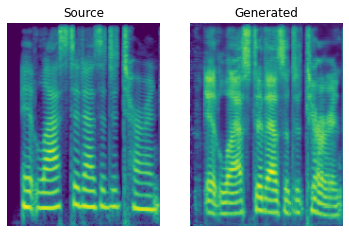

Mean D loss: 0.5297917127609253 Mean G loss: 0.639975905418396 Mean ID loss: 0.12410229444503784
[Epoch 10/50] [Batch 0] [D loss f: 0.5421822667121887 r: 0.5424619913101196] [G loss: 0.6619423627853394] [ID loss: 0.12271362543106079] [LR: 0.0002]
[Epoch 10/50] [Batch 600] [D loss f: 0.5401610136032104 r: 0.5415011644363403] [G loss: 0.6196509003639221] [ID loss: 0.12297017127275467] [LR: 0.0002]
[Epoch 10/50] [Batch 1200] [D loss f: 0.5292312502861023 r: 0.5432811379432678] [G loss: 0.6574285626411438] [ID loss: 0.12305346131324768] [LR: 0.0002]
[Epoch 10/50] [Batch 1800] [D loss f: 0.5358389019966125 r: 0.5353862643241882] [G loss: 0.5709642171859741] [ID loss: 0.12292560935020447] [LR: 0.0002]
[Epoch 10/50] [Batch 2400] [D loss f: 0.5336875319480896 r: 0.5459362864494324] [G loss: 0.6486722826957703] [ID loss: 0.1231226846575737] [LR: 0.0002]
[Epoch 10/50] [Batch 3000] [D loss f: 0.5312551856040955 r: 0.5475136041641235] [G loss: 0.633416473865509] [ID loss: 0.12257757782936096] [LR:

  4%|▍         | 80/2000 [00:00<00:03, 549.00it/s, loss=0.0159, spectral_convergence=-4.59]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 581.02it/s, loss=0.000155, spectral_convergence=-47.4]


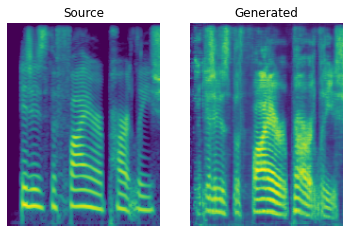

Mean D loss: 0.5328782200813293 Mean G loss: 0.6305059194564819 Mean ID loss: 0.1225503459572792
[Epoch 11/50] [Batch 0] [D loss f: 0.5420700311660767 r: 0.5646325945854187] [G loss: 0.6471739411354065] [ID loss: 0.1219663918018341] [LR: 0.0002]
[Epoch 11/50] [Batch 600] [D loss f: 0.5302804708480835 r: 0.5487522482872009] [G loss: 0.5937219262123108] [ID loss: 0.12288787961006165] [LR: 0.0002]
[Epoch 11/50] [Batch 1200] [D loss f: 0.5338046550750732 r: 0.5542154908180237] [G loss: 0.5784796476364136] [ID loss: 0.1219032034277916] [LR: 0.0002]
[Epoch 11/50] [Batch 1800] [D loss f: 0.5351307392120361 r: 0.5570079684257507] [G loss: 0.6232526898384094] [ID loss: 0.12212436646223068] [LR: 0.0002]
[Epoch 11/50] [Batch 2400] [D loss f: 0.5308303833007812 r: 0.5530259013175964] [G loss: 0.5920035243034363] [ID loss: 0.12233978509902954] [LR: 0.0002]
[Epoch 11/50] [Batch 3000] [D loss f: 0.5354203581809998 r: 0.5413577556610107] [G loss: 0.6138917803764343] [ID loss: 0.12216643244028091] [LR:

  4%|▍         | 90/2000 [00:00<00:03, 584.53it/s, loss=0.00919, spectral_convergence=-8.87]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 587.25it/s, loss=0.000367, spectral_convergence=-37.6]


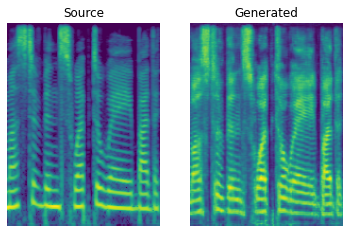

Mean D loss: 0.5353617668151855 Mean G loss: 0.6193606853485107 Mean ID loss: 0.12153399735689163
[Epoch 12/50] [Batch 0] [D loss f: 0.5308394432067871 r: 0.552649974822998] [G loss: 0.647014856338501] [ID loss: 0.12067148834466934] [LR: 0.0002]
[Epoch 12/50] [Batch 600] [D loss f: 0.538925051689148 r: 0.5516348481178284] [G loss: 0.5912421941757202] [ID loss: 0.12046363949775696] [LR: 0.0002]
[Epoch 12/50] [Batch 1200] [D loss f: 0.5387952923774719 r: 0.5518233180046082] [G loss: 0.6355540156364441] [ID loss: 0.11996922641992569] [LR: 0.0002]
[Epoch 12/50] [Batch 1800] [D loss f: 0.5442017316818237 r: 0.554118275642395] [G loss: 0.6100049018859863] [ID loss: 0.12033691257238388] [LR: 0.0002]
[Epoch 12/50] [Batch 2400] [D loss f: 0.5438518524169922 r: 0.5501816868782043] [G loss: 0.6149322390556335] [ID loss: 0.12022212892770767] [LR: 0.0002]
[Epoch 12/50] [Batch 3000] [D loss f: 0.5423122048377991 r: 0.5521367192268372] [G loss: 0.6399238109588623] [ID loss: 0.12002327293157578] [LR: 

  4%|▍         | 90/2000 [00:00<00:03, 588.73it/s, loss=0.00913, spectral_convergence=-7.27]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 581.64it/s, loss=0.00129, spectral_convergence=-27]


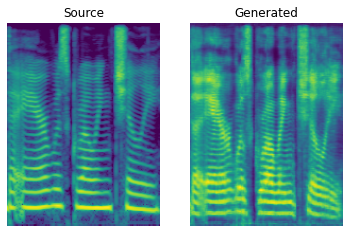

Mean D loss: 0.5389700531959534 Mean G loss: 0.6192257404327393 Mean ID loss: 0.12011417001485825
[Epoch 13/50] [Batch 0] [D loss f: 0.5330097079277039 r: 0.5559934377670288] [G loss: 0.6925845742225647] [ID loss: 0.11981469392776489] [LR: 0.0002]
[Epoch 13/50] [Batch 600] [D loss f: 0.5394895076751709 r: 0.5488979816436768] [G loss: 0.5951991081237793] [ID loss: 0.11988794803619385] [LR: 0.0002]
[Epoch 13/50] [Batch 1200] [D loss f: 0.5359221696853638 r: 0.5561004877090454] [G loss: 0.5770840644836426] [ID loss: 0.11949450522661209] [LR: 0.0002]
[Epoch 13/50] [Batch 1800] [D loss f: 0.5437155365943909 r: 0.5507701635360718] [G loss: 0.6834888458251953] [ID loss: 0.11975941807031631] [LR: 0.0002]
[Epoch 13/50] [Batch 2400] [D loss f: 0.5456087589263916 r: 0.5526360273361206] [G loss: 0.5884756445884705] [ID loss: 0.11999735236167908] [LR: 0.0002]
[Epoch 13/50] [Batch 3000] [D loss f: 0.5506036281585693 r: 0.5472250580787659] [G loss: 0.6356010437011719] [ID loss: 0.11874855309724808] [

  4%|▍         | 90/2000 [00:00<00:03, 572.74it/s, loss=0.0165, spectral_convergence=-5]   

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 571.61it/s, loss=0.000714, spectral_convergence=-31.9]


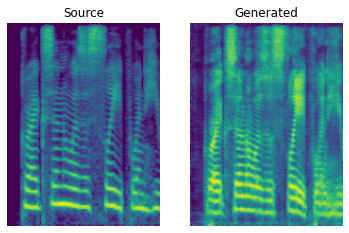

Mean D loss: 0.5378507971763611 Mean G loss: 0.5993794798851013 Mean ID loss: 0.11920235306024551
[Epoch 14/50] [Batch 0] [D loss f: 0.5327084064483643 r: 0.5705440044403076] [G loss: 0.57939612865448] [ID loss: 0.11859654635190964] [LR: 0.0002]
[Epoch 14/50] [Batch 600] [D loss f: 0.531627893447876 r: 0.5634427070617676] [G loss: 0.5909571051597595] [ID loss: 0.11923059821128845] [LR: 0.0002]
[Epoch 14/50] [Batch 1200] [D loss f: 0.5316303372383118 r: 0.5633598566055298] [G loss: 0.5430244207382202] [ID loss: 0.11896459013223648] [LR: 0.0002]
[Epoch 14/50] [Batch 1800] [D loss f: 0.5403748750686646 r: 0.5491911172866821] [G loss: 0.6570549607276917] [ID loss: 0.11885635554790497] [LR: 0.0002]
[Epoch 14/50] [Batch 2400] [D loss f: 0.5362505316734314 r: 0.5508038401603699] [G loss: 0.6479756832122803] [ID loss: 0.11839449405670166] [LR: 0.0002]
[Epoch 14/50] [Batch 3000] [D loss f: 0.533596932888031 r: 0.5532387495040894] [G loss: 0.5884734988212585] [ID loss: 0.1185067743062973] [LR: 0

  4%|▍         | 90/2000 [00:00<00:03, 567.05it/s, loss=0.00834, spectral_convergence=-8.29]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 584.62it/s, loss=0.000228, spectral_convergence=-33.7]


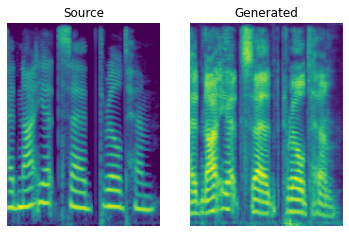

Mean D loss: 0.5382590293884277 Mean G loss: 0.5886023640632629 Mean ID loss: 0.11829204112291336
[Epoch 15/50] [Batch 0] [D loss f: 0.5479692220687866 r: 0.5550881624221802] [G loss: 0.629790723323822] [ID loss: 0.11749730259180069] [LR: 0.0002]
[Epoch 15/50] [Batch 600] [D loss f: 0.5381829738616943 r: 0.5565686821937561] [G loss: 0.5733416080474854] [ID loss: 0.11781928688287735] [LR: 0.0002]
[Epoch 15/50] [Batch 1200] [D loss f: 0.5406518578529358 r: 0.5578112602233887] [G loss: 0.57989501953125] [ID loss: 0.11777058988809586] [LR: 0.0002]
[Epoch 15/50] [Batch 1800] [D loss f: 0.5407204031944275 r: 0.5580368041992188] [G loss: 0.5864282250404358] [ID loss: 0.11702944338321686] [LR: 0.0002]
[Epoch 15/50] [Batch 2400] [D loss f: 0.5426027178764343 r: 0.5569983720779419] [G loss: 0.6184503436088562] [ID loss: 0.11785555630922318] [LR: 0.0002]
[Epoch 15/50] [Batch 3000] [D loss f: 0.5399863719940186 r: 0.5613664984703064] [G loss: 0.5929643511772156] [ID loss: 0.11721749603748322] [LR:

  4%|▍         | 80/2000 [00:00<00:03, 547.56it/s, loss=0.0137, spectral_convergence=-5.29]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 567.98it/s, loss=0.000373, spectral_convergence=-37.7]


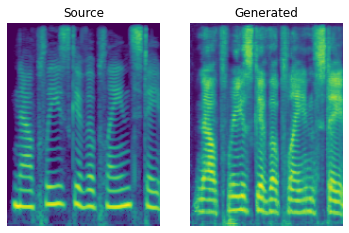

Mean D loss: 0.5403314828872681 Mean G loss: 0.5834435820579529 Mean ID loss: 0.11717618256807327
[Epoch 16/50] [Batch 0] [D loss f: 0.5437129735946655 r: 0.559083104133606] [G loss: 0.5309577584266663] [ID loss: 0.1167215034365654] [LR: 0.0002]
[Epoch 16/50] [Batch 600] [D loss f: 0.5344735980033875 r: 0.5612704157829285] [G loss: 0.6077222228050232] [ID loss: 0.11662854254245758] [LR: 0.0002]
[Epoch 16/50] [Batch 1200] [D loss f: 0.5333912372589111 r: 0.556027352809906] [G loss: 0.557887852191925] [ID loss: 0.11670898646116257] [LR: 0.0002]
[Epoch 16/50] [Batch 1800] [D loss f: 0.5426917672157288 r: 0.5495430827140808] [G loss: 0.5976923704147339] [ID loss: 0.11668673157691956] [LR: 0.0002]
[Epoch 16/50] [Batch 2400] [D loss f: 0.5436524748802185 r: 0.546066164970398] [G loss: 0.5756975412368774] [ID loss: 0.11627110838890076] [LR: 0.0002]
[Epoch 16/50] [Batch 3000] [D loss f: 0.5329703688621521 r: 0.5571932196617126] [G loss: 0.5842092633247375] [ID loss: 0.11672928184270859] [LR: 0

  4%|▍         | 80/2000 [00:00<00:03, 509.11it/s, loss=0.00257, spectral_convergence=-8.36]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 548.58it/s, loss=0.000137, spectral_convergence=-43.3]


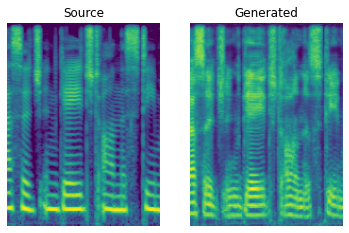

Mean D loss: 0.5396664142608643 Mean G loss: 0.595799446105957 Mean ID loss: 0.11610180884599686
[Epoch 17/50] [Batch 0] [D loss f: 0.544826090335846 r: 0.5477957129478455] [G loss: 0.6104529500007629] [ID loss: 0.11590979993343353] [LR: 0.0002]
[Epoch 17/50] [Batch 600] [D loss f: 0.5419615507125854 r: 0.544521152973175] [G loss: 0.5933315753936768] [ID loss: 0.11569217592477798] [LR: 0.0002]
[Epoch 17/50] [Batch 1200] [D loss f: 0.5534709692001343 r: 0.5536985993385315] [G loss: 0.6351781487464905] [ID loss: 0.11559387296438217] [LR: 0.0002]
[Epoch 17/50] [Batch 1800] [D loss f: 0.5379684567451477 r: 0.5450074076652527] [G loss: 0.5973635911941528] [ID loss: 0.11563730984926224] [LR: 0.0002]
[Epoch 17/50] [Batch 2400] [D loss f: 0.535286545753479 r: 0.5540870428085327] [G loss: 0.6187537908554077] [ID loss: 0.11566575616598129] [LR: 0.0002]
[Epoch 17/50] [Batch 3000] [D loss f: 0.5397958159446716 r: 0.5549575090408325] [G loss: 0.5775415301322937] [ID loss: 0.11554557830095291] [LR: 

  4%|▍         | 90/2000 [00:00<00:03, 586.70it/s, loss=0.00662, spectral_convergence=-6.74]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 575.85it/s, loss=0.000546, spectral_convergence=-34.1]


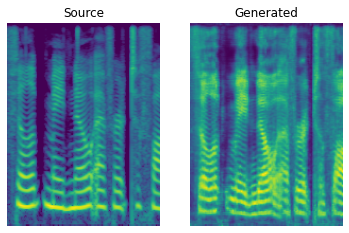

Mean D loss: 0.5399365425109863 Mean G loss: 0.588315486907959 Mean ID loss: 0.1153879463672638
[Epoch 18/50] [Batch 0] [D loss f: 0.5427470803260803 r: 0.5505662560462952] [G loss: 0.6439696550369263] [ID loss: 0.11482717841863632] [LR: 0.0002]
[Epoch 18/50] [Batch 600] [D loss f: 0.538847029209137 r: 0.5559676885604858] [G loss: 0.5908381938934326] [ID loss: 0.11490236967802048] [LR: 0.0002]
[Epoch 18/50] [Batch 1200] [D loss f: 0.5364123582839966 r: 0.5525784492492676] [G loss: 0.5997652411460876] [ID loss: 0.11490839719772339] [LR: 0.0002]
[Epoch 18/50] [Batch 1800] [D loss f: 0.5348640084266663 r: 0.5574108362197876] [G loss: 0.581675112247467] [ID loss: 0.11471956968307495] [LR: 0.0002]
[Epoch 18/50] [Batch 2400] [D loss f: 0.534984827041626 r: 0.5555513501167297] [G loss: 0.5619728565216064] [ID loss: 0.11484784632921219] [LR: 0.0002]
[Epoch 18/50] [Batch 3000] [D loss f: 0.541577935218811 r: 0.5564695000648499] [G loss: 0.5884436368942261] [ID loss: 0.11426243931055069] [LR: 0.

  4%|▍         | 90/2000 [00:00<00:03, 565.96it/s, loss=0.00579, spectral_convergence=-8.88]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 569.34it/s, loss=0.00105, spectral_convergence=-28.4]


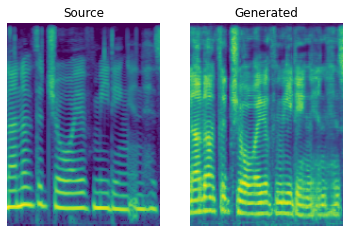

Mean D loss: 0.5388323068618774 Mean G loss: 0.5806202292442322 Mean ID loss: 0.11448890715837479
[Epoch 19/50] [Batch 0] [D loss f: 0.540646493434906 r: 0.5457655191421509] [G loss: 0.5930209159851074] [ID loss: 0.11472231149673462] [LR: 0.0002]
[Epoch 19/50] [Batch 600] [D loss f: 0.5405600666999817 r: 0.561510443687439] [G loss: 0.5495656132698059] [ID loss: 0.11353368312120438] [LR: 0.0002]
[Epoch 19/50] [Batch 1200] [D loss f: 0.5411635041236877 r: 0.5499374270439148] [G loss: 0.5835255980491638] [ID loss: 0.11478683352470398] [LR: 0.0002]
[Epoch 19/50] [Batch 1800] [D loss f: 0.5386642217636108 r: 0.554630696773529] [G loss: 0.5711683630943298] [ID loss: 0.11390569061040878] [LR: 0.0002]
[Epoch 19/50] [Batch 2400] [D loss f: 0.5381864309310913 r: 0.5522666573524475] [G loss: 0.5709331035614014] [ID loss: 0.1140240877866745] [LR: 0.0002]
[Epoch 19/50] [Batch 3000] [D loss f: 0.5470326542854309 r: 0.5463505983352661] [G loss: 0.6104835867881775] [ID loss: 0.11386491358280182] [LR: 

  4%|▍         | 90/2000 [00:00<00:03, 585.80it/s, loss=0.00492, spectral_convergence=-7.61]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 552.55it/s, loss=0.000189, spectral_convergence=-38.7]


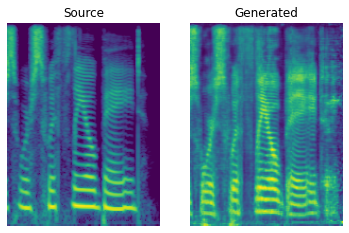

Mean D loss: 0.541412353515625 Mean G loss: 0.5769110321998596 Mean ID loss: 0.11380743980407715
[Epoch 20/50] [Batch 0] [D loss f: 0.5347164869308472 r: 0.5503131747245789] [G loss: 0.5782820582389832] [ID loss: 0.11356527358293533] [LR: 0.0002]
[Epoch 20/50] [Batch 600] [D loss f: 0.5367251038551331 r: 0.555535614490509] [G loss: 0.6012619137763977] [ID loss: 0.11367306858301163] [LR: 0.0002]
[Epoch 20/50] [Batch 1200] [D loss f: 0.5402477979660034 r: 0.5444921851158142] [G loss: 0.5643612742424011] [ID loss: 0.11356812715530396] [LR: 0.0002]
[Epoch 20/50] [Batch 1800] [D loss f: 0.5451626777648926 r: 0.5472427606582642] [G loss: 0.6004555225372314] [ID loss: 0.1134224459528923] [LR: 0.0002]
[Epoch 20/50] [Batch 2400] [D loss f: 0.5499159693717957 r: 0.5473805665969849] [G loss: 0.6035302877426147] [ID loss: 0.11306550353765488] [LR: 0.0002]
[Epoch 20/50] [Batch 3000] [D loss f: 0.5383805632591248 r: 0.5478008985519409] [G loss: 0.5600990056991577] [ID loss: 0.11311856657266617] [LR:

  4%|▍         | 90/2000 [00:00<00:03, 549.38it/s, loss=0.00346, spectral_convergence=-9.37]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 571.57it/s, loss=0.000244, spectral_convergence=-36.9]


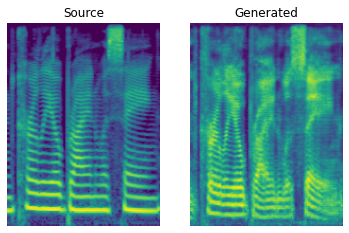

Mean D loss: 0.5399953126907349 Mean G loss: 0.5820877552032471 Mean ID loss: 0.11325575411319733
[Epoch 21/50] [Batch 0] [D loss f: 0.533669650554657 r: 0.5512652397155762] [G loss: 0.5293824076652527] [ID loss: 0.11308905482292175] [LR: 0.0002]
[Epoch 21/50] [Batch 600] [D loss f: 0.5377174615859985 r: 0.5480933785438538] [G loss: 0.5672321319580078] [ID loss: 0.11349618434906006] [LR: 0.0002]
[Epoch 21/50] [Batch 1200] [D loss f: 0.5346599221229553 r: 0.560099184513092] [G loss: 0.5328924655914307] [ID loss: 0.11291678249835968] [LR: 0.0002]
[Epoch 21/50] [Batch 1800] [D loss f: 0.5442898273468018 r: 0.5462119579315186] [G loss: 0.5990116596221924] [ID loss: 0.11259263008832932] [LR: 0.0002]
[Epoch 21/50] [Batch 2400] [D loss f: 0.5392895340919495 r: 0.5544383525848389] [G loss: 0.597363293170929] [ID loss: 0.11263415962457657] [LR: 0.0002]
[Epoch 21/50] [Batch 3000] [D loss f: 0.5470870733261108 r: 0.5476689338684082] [G loss: 0.5575921535491943] [ID loss: 0.11268488317728043] [LR:

  4%|▍         | 90/2000 [00:00<00:03, 584.50it/s, loss=0.00899, spectral_convergence=-7.84]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 573.35it/s, loss=0.000241, spectral_convergence=-50.5]


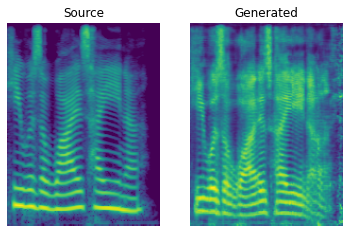

Mean D loss: 0.5403203368186951 Mean G loss: 0.5735816359519958 Mean ID loss: 0.11277694255113602
[Epoch 22/50] [Batch 0] [D loss f: 0.5399557948112488 r: 0.5407721996307373] [G loss: 0.5778157114982605] [ID loss: 0.11218363046646118] [LR: 0.0002]
[Epoch 22/50] [Batch 600] [D loss f: 0.5393560528755188 r: 0.5467663407325745] [G loss: 0.5748658776283264] [ID loss: 0.11224216222763062] [LR: 0.0002]
[Epoch 22/50] [Batch 1200] [D loss f: 0.5456541180610657 r: 0.5432178974151611] [G loss: 0.5841125249862671] [ID loss: 0.11250632256269455] [LR: 0.0002]
[Epoch 22/50] [Batch 1800] [D loss f: 0.5433348417282104 r: 0.5428198575973511] [G loss: 0.6236657500267029] [ID loss: 0.11208946257829666] [LR: 0.0002]
[Epoch 22/50] [Batch 2400] [D loss f: 0.540561854839325 r: 0.5435322523117065] [G loss: 0.604232668876648] [ID loss: 0.11248555779457092] [LR: 0.0002]
[Epoch 22/50] [Batch 3000] [D loss f: 0.5379348397254944 r: 0.5461195707321167] [G loss: 0.5855841040611267] [ID loss: 0.11260706931352615] [LR

  4%|▍         | 90/2000 [00:00<00:03, 573.65it/s, loss=0.00846, spectral_convergence=-6.86]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 581.38it/s, loss=0.000475, spectral_convergence=-32.5]


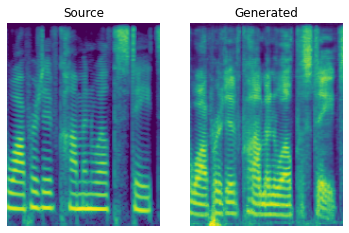

Mean D loss: 0.5376948118209839 Mean G loss: 0.5885481238365173 Mean ID loss: 0.11219058930873871
[Epoch 23/50] [Batch 0] [D loss f: 0.5275043249130249 r: 0.5580682158470154] [G loss: 0.6187074184417725] [ID loss: 0.11179929226636887] [LR: 0.0002]
[Epoch 23/50] [Batch 600] [D loss f: 0.5336498022079468 r: 0.5424139499664307] [G loss: 0.5944215655326843] [ID loss: 0.1117115244269371] [LR: 0.0002]
[Epoch 23/50] [Batch 1200] [D loss f: 0.5376672148704529 r: 0.5458313822746277] [G loss: 0.5789706707000732] [ID loss: 0.11178272217512131] [LR: 0.0002]
[Epoch 23/50] [Batch 1800] [D loss f: 0.538414716720581 r: 0.5479968786239624] [G loss: 0.5740292072296143] [ID loss: 0.11176852136850357] [LR: 0.0002]
[Epoch 23/50] [Batch 2400] [D loss f: 0.5314910411834717 r: 0.5506977438926697] [G loss: 0.5735322833061218] [ID loss: 0.1118360161781311] [LR: 0.0002]
[Epoch 23/50] [Batch 3000] [D loss f: 0.5286319255828857 r: 0.5454674959182739] [G loss: 0.585675060749054] [ID loss: 0.11172699183225632] [LR: 

  4%|▍         | 80/2000 [00:00<00:03, 570.48it/s, loss=0.0115, spectral_convergence=-5.61]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 570.21it/s, loss=0.00127, spectral_convergence=-24.9]


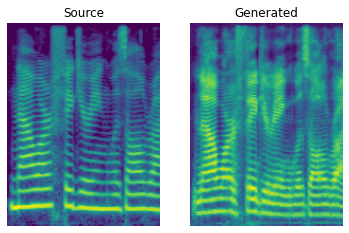

Mean D loss: 0.5334674119949341 Mean G loss: 0.5767244100570679 Mean ID loss: 0.11164722591638565
[Epoch 24/50] [Batch 0] [D loss f: 0.5219799876213074 r: 0.5531904101371765] [G loss: 0.5536742806434631] [ID loss: 0.11126314103603363] [LR: 0.0002]
[Epoch 24/50] [Batch 600] [D loss f: 0.5318515300750732 r: 0.5507394671440125] [G loss: 0.5453781485557556] [ID loss: 0.11121111363172531] [LR: 0.0002]
[Epoch 24/50] [Batch 1200] [D loss f: 0.5307746529579163 r: 0.5466265082359314] [G loss: 0.5647776126861572] [ID loss: 0.11101332306861877] [LR: 0.0002]
[Epoch 24/50] [Batch 1800] [D loss f: 0.5343364477157593 r: 0.5415115356445312] [G loss: 0.5705136060714722] [ID loss: 0.11142972111701965] [LR: 0.0002]
[Epoch 24/50] [Batch 2400] [D loss f: 0.5372126698493958 r: 0.541629433631897] [G loss: 0.5724383592605591] [ID loss: 0.11156636476516724] [LR: 0.0002]
[Epoch 24/50] [Batch 3000] [D loss f: 0.5383222699165344 r: 0.554367184638977] [G loss: 0.5262662172317505] [ID loss: 0.11093645542860031] [LR

  4%|▍         | 90/2000 [00:00<00:03, 583.72it/s, loss=0.00607, spectral_convergence=-6.24]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 566.40it/s, loss=0.00229, spectral_convergence=-15.9]


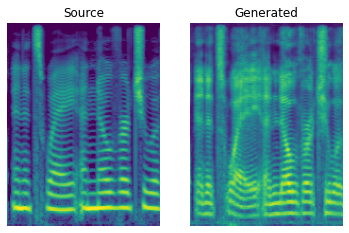

Mean D loss: 0.5330058336257935 Mean G loss: 0.5625531077384949 Mean ID loss: 0.11111512035131454
[Epoch 25/50] [Batch 0] [D loss f: 0.5354083180427551 r: 0.5554523468017578] [G loss: 0.510519802570343] [ID loss: 0.11129731684923172] [LR: 0.0002]
[Epoch 25/50] [Batch 600] [D loss f: 0.5379178524017334 r: 0.5362567901611328] [G loss: 0.6035961508750916] [ID loss: 0.11093930900096893] [LR: 0.0002]
[Epoch 25/50] [Batch 1200] [D loss f: 0.5336187481880188 r: 0.5369692444801331] [G loss: 0.5634243488311768] [ID loss: 0.11073046177625656] [LR: 0.0002]
[Epoch 25/50] [Batch 1800] [D loss f: 0.5288559198379517 r: 0.5364647507667542] [G loss: 0.5422390699386597] [ID loss: 0.11064206808805466] [LR: 0.0002]
[Epoch 25/50] [Batch 2400] [D loss f: 0.5283048748970032 r: 0.5462124347686768] [G loss: 0.6256632804870605] [ID loss: 0.110620878636837] [LR: 0.0002]
[Epoch 25/50] [Batch 3000] [D loss f: 0.5364276766777039 r: 0.5450475811958313] [G loss: 0.5674131512641907] [ID loss: 0.1106523647904396] [LR: 

  4%|▍         | 90/2000 [00:00<00:03, 574.98it/s, loss=0.00409, spectral_convergence=-11.3]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 579.44it/s, loss=0.000385, spectral_convergence=-36.7]


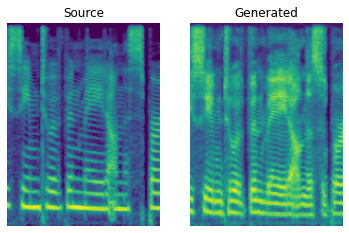

Mean D loss: 0.5318487286567688 Mean G loss: 0.5763013362884521 Mean ID loss: 0.1105409637093544
[Epoch 26/50] [Batch 0] [D loss f: 0.5378625988960266 r: 0.5344579219818115] [G loss: 0.6413328051567078] [ID loss: 0.1099451556801796] [LR: 0.0002]
[Epoch 26/50] [Batch 600] [D loss f: 0.5356343388557434 r: 0.5394142866134644] [G loss: 0.6334150433540344] [ID loss: 0.1101875826716423] [LR: 0.0002]
[Epoch 26/50] [Batch 1200] [D loss f: 0.5382531881332397 r: 0.5364713072776794] [G loss: 0.565831184387207] [ID loss: 0.10966073721647263] [LR: 0.0002]
[Epoch 26/50] [Batch 1800] [D loss f: 0.5331823825836182 r: 0.5415963530540466] [G loss: 0.5936416387557983] [ID loss: 0.11054769158363342] [LR: 0.0002]
[Epoch 26/50] [Batch 2400] [D loss f: 0.5357692241668701 r: 0.5326585173606873] [G loss: 0.5807422399520874] [ID loss: 0.11030377447605133] [LR: 0.0002]
[Epoch 26/50] [Batch 3000] [D loss f: 0.5268270969390869 r: 0.5429946780204773] [G loss: 0.5114179253578186] [ID loss: 0.1102510318160057] [LR: 0

  4%|▍         | 80/2000 [00:00<00:03, 528.50it/s, loss=0.0115, spectral_convergence=-6.14]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 567.55it/s, loss=0.000727, spectral_convergence=-27.4]


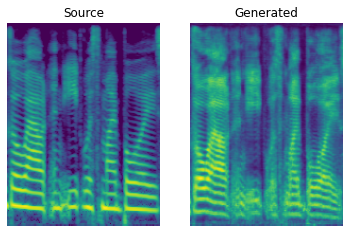

Mean D loss: 0.5311429500579834 Mean G loss: 0.5808534622192383 Mean ID loss: 0.10995066910982132
[Epoch 27/50] [Batch 0] [D loss f: 0.5361956357955933 r: 0.5306654572486877] [G loss: 0.6186178922653198] [ID loss: 0.10982490330934525] [LR: 0.0002]
[Epoch 27/50] [Batch 600] [D loss f: 0.5349701046943665 r: 0.5356141924858093] [G loss: 0.5646240711212158] [ID loss: 0.10997097939252853] [LR: 0.0002]
[Epoch 27/50] [Batch 1200] [D loss f: 0.5308651924133301 r: 0.537187933921814] [G loss: 0.5797069072723389] [ID loss: 0.10970160365104675] [LR: 0.0002]
[Epoch 27/50] [Batch 1800] [D loss f: 0.5318053364753723 r: 0.533845841884613] [G loss: 0.5865495204925537] [ID loss: 0.10913803428411484] [LR: 0.0002]
[Epoch 27/50] [Batch 2400] [D loss f: 0.5275669097900391 r: 0.5434982180595398] [G loss: 0.5674489140510559] [ID loss: 0.10948753356933594] [LR: 0.0002]
[Epoch 27/50] [Batch 3000] [D loss f: 0.5307071805000305 r: 0.5384336113929749] [G loss: 0.5685655474662781] [ID loss: 0.10985445976257324] [LR

  4%|▍         | 80/2000 [00:00<00:03, 512.33it/s, loss=0.00535, spectral_convergence=-7.88]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 578.67it/s, loss=0.00127, spectral_convergence=-25.1]


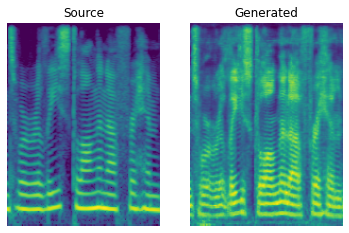

Mean D loss: 0.528782308101654 Mean G loss: 0.5765430331230164 Mean ID loss: 0.10952088981866837
[Epoch 28/50] [Batch 0] [D loss f: 0.5161968469619751 r: 0.5507165789604187] [G loss: 0.5860364437103271] [ID loss: 0.10915620625019073] [LR: 0.0002]
[Epoch 28/50] [Batch 600] [D loss f: 0.5308979153633118 r: 0.5375049114227295] [G loss: 0.5967420935630798] [ID loss: 0.10912288725376129] [LR: 0.0002]
[Epoch 28/50] [Batch 1200] [D loss f: 0.5304824709892273 r: 0.5366677641868591] [G loss: 0.605002760887146] [ID loss: 0.1086680218577385] [LR: 0.0002]
[Epoch 28/50] [Batch 1800] [D loss f: 0.5230861902236938 r: 0.5328513383865356] [G loss: 0.5579643845558167] [ID loss: 0.10943084955215454] [LR: 0.0002]
[Epoch 28/50] [Batch 2400] [D loss f: 0.5343656539916992 r: 0.5308670997619629] [G loss: 0.5942495465278625] [ID loss: 0.10872828215360641] [LR: 0.0002]
[Epoch 28/50] [Batch 3000] [D loss f: 0.5227712988853455 r: 0.5310420393943787] [G loss: 0.5572678446769714] [ID loss: 0.10912765562534332] [LR:

  4%|▍         | 90/2000 [00:00<00:03, 578.36it/s, loss=0.00591, spectral_convergence=-9.71]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 570.67it/s, loss=0.000159, spectral_convergence=-54.5]


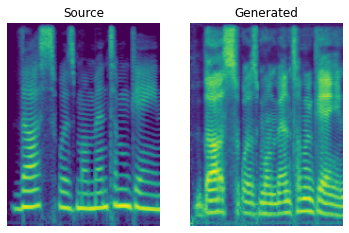

Mean D loss: 0.5269650816917419 Mean G loss: 0.5865508317947388 Mean ID loss: 0.1088656410574913
[Epoch 29/50] [Batch 0] [D loss f: 0.5247381925582886 r: 0.5259106755256653] [G loss: 0.6065037250518799] [ID loss: 0.10861850529909134] [LR: 0.0002]
[Epoch 29/50] [Batch 600] [D loss f: 0.528768002986908 r: 0.5298618674278259] [G loss: 0.5979073643684387] [ID loss: 0.10871505737304688] [LR: 0.0002]
[Epoch 29/50] [Batch 1200] [D loss f: 0.5200265645980835 r: 0.5385342240333557] [G loss: 0.5973203778266907] [ID loss: 0.10851261019706726] [LR: 0.0002]
[Epoch 29/50] [Batch 1800] [D loss f: 0.5226498246192932 r: 0.5375248193740845] [G loss: 0.5875092148780823] [ID loss: 0.10862996429204941] [LR: 0.0002]
[Epoch 29/50] [Batch 2400] [D loss f: 0.5118853449821472 r: 0.5349586009979248] [G loss: 0.578042209148407] [ID loss: 0.10847501456737518] [LR: 0.0002]
[Epoch 29/50] [Batch 3000] [D loss f: 0.5193682909011841 r: 0.5405911207199097] [G loss: 0.5812951922416687] [ID loss: 0.108613982796669] [LR: 0

  4%|▍         | 90/2000 [00:00<00:03, 598.82it/s, loss=0.00797, spectral_convergence=-7.65]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 572.92it/s, loss=0.000285, spectral_convergence=-39.2]


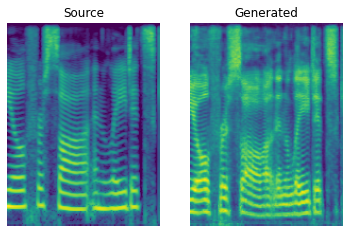

Mean D loss: 0.5217626690864563 Mean G loss: 0.585211992263794 Mean ID loss: 0.10858684033155441
[Epoch 30/50] [Batch 0] [D loss f: 0.5212814211845398 r: 0.5349801182746887] [G loss: 0.643512487411499] [ID loss: 0.10828061401844025] [LR: 0.0002]
[Epoch 30/50] [Batch 600] [D loss f: 0.5315738916397095 r: 0.5265709161758423] [G loss: 0.5773512721061707] [ID loss: 0.10844362527132034] [LR: 0.0002]
[Epoch 30/50] [Batch 1200] [D loss f: 0.5199745297431946 r: 0.5410666465759277] [G loss: 0.5491843223571777] [ID loss: 0.10830485075712204] [LR: 0.0002]
[Epoch 30/50] [Batch 1800] [D loss f: 0.5213636159896851 r: 0.5315216183662415] [G loss: 0.5581442713737488] [ID loss: 0.10852088779211044] [LR: 0.0002]
[Epoch 30/50] [Batch 2400] [D loss f: 0.5182575583457947 r: 0.5389776825904846] [G loss: 0.5832071900367737] [ID loss: 0.1083102896809578] [LR: 0.0002]
[Epoch 30/50] [Batch 3000] [D loss f: 0.5200880169868469 r: 0.5389627814292908] [G loss: 0.5548113584518433] [ID loss: 0.10799980163574219] [LR:

  4%|▍         | 90/2000 [00:00<00:03, 553.89it/s, loss=0.00536, spectral_convergence=-9.11]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 566.37it/s, loss=0.000213, spectral_convergence=-42.9]


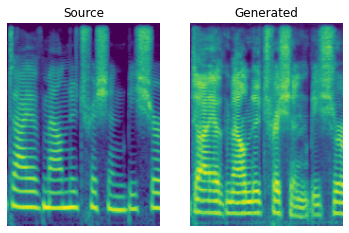

Mean D loss: 0.5214863419532776 Mean G loss: 0.5769222974777222 Mean ID loss: 0.10811364650726318
[Epoch 31/50] [Batch 0] [D loss f: 0.5198925137519836 r: 0.5386150479316711] [G loss: 0.5942936539649963] [ID loss: 0.10799773782491684] [LR: 0.0002]
[Epoch 31/50] [Batch 600] [D loss f: 0.5191856026649475 r: 0.5378324389457703] [G loss: 0.5691943764686584] [ID loss: 0.10813841223716736] [LR: 0.0002]
[Epoch 31/50] [Batch 1200] [D loss f: 0.5157503485679626 r: 0.5366227626800537] [G loss: 0.601301372051239] [ID loss: 0.10789117217063904] [LR: 0.0002]
[Epoch 31/50] [Batch 1800] [D loss f: 0.523407518863678 r: 0.5277708172798157] [G loss: 0.5756105780601501] [ID loss: 0.10796449333429337] [LR: 0.0002]
[Epoch 31/50] [Batch 2400] [D loss f: 0.520726203918457 r: 0.5321285128593445] [G loss: 0.5635786652565002] [ID loss: 0.10775897651910782] [LR: 0.0002]
[Epoch 31/50] [Batch 3000] [D loss f: 0.5203478336334229 r: 0.5267634391784668] [G loss: 0.5693052411079407] [ID loss: 0.10790031403303146] [LR:

  4%|▍         | 90/2000 [00:00<00:03, 590.96it/s, loss=0.00897, spectral_convergence=-7.45]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 574.97it/s, loss=0.000705, spectral_convergence=-27.7]


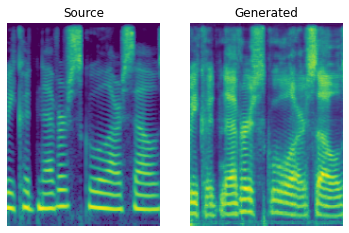

Mean D loss: 0.5203490257263184 Mean G loss: 0.5759503841400146 Mean ID loss: 0.10782285034656525
[Epoch 32/50] [Batch 0] [D loss f: 0.5285099148750305 r: 0.52898108959198] [G loss: 0.5595124363899231] [ID loss: 0.1077117919921875] [LR: 0.0002]
[Epoch 32/50] [Batch 600] [D loss f: 0.5191419720649719 r: 0.5359140038490295] [G loss: 0.580398678779602] [ID loss: 0.10804937034845352] [LR: 0.0002]
[Epoch 32/50] [Batch 1200] [D loss f: 0.5187487602233887 r: 0.5260022282600403] [G loss: 0.573444128036499] [ID loss: 0.10782675445079803] [LR: 0.0002]
[Epoch 32/50] [Batch 1800] [D loss f: 0.5239407420158386 r: 0.5283957719802856] [G loss: 0.5968210101127625] [ID loss: 0.10767697542905807] [LR: 0.0002]
[Epoch 32/50] [Batch 2400] [D loss f: 0.5154832005500793 r: 0.530925989151001] [G loss: 0.5500673651695251] [ID loss: 0.10735706239938736] [LR: 0.0002]
[Epoch 32/50] [Batch 3000] [D loss f: 0.5197044610977173 r: 0.5324020981788635] [G loss: 0.6241609454154968] [ID loss: 0.10740568488836288] [LR: 0.

  4%|▍         | 90/2000 [00:00<00:03, 586.33it/s, loss=0.00645, spectral_convergence=-9.09]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 569.85it/s, loss=0.001, spectral_convergence=-26.8]


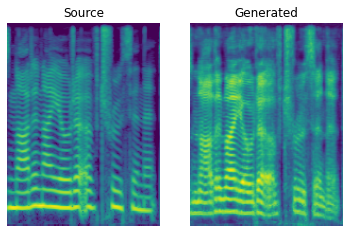

Mean D loss: 0.5182805061340332 Mean G loss: 0.583037793636322 Mean ID loss: 0.10752478986978531
[Epoch 33/50] [Batch 0] [D loss f: 0.531319797039032 r: 0.5267006754875183] [G loss: 0.5865731239318848] [ID loss: 0.10709059983491898] [LR: 0.0002]
[Epoch 33/50] [Batch 600] [D loss f: 0.5187859535217285 r: 0.5323889255523682] [G loss: 0.5821307897567749] [ID loss: 0.10716623812913895] [LR: 0.0002]
[Epoch 33/50] [Batch 1200] [D loss f: 0.5141762495040894 r: 0.5291186571121216] [G loss: 0.5577642917633057] [ID loss: 0.10755623131990433] [LR: 0.0002]
[Epoch 33/50] [Batch 1800] [D loss f: 0.5205312371253967 r: 0.5253546237945557] [G loss: 0.5417729616165161] [ID loss: 0.10721482336521149] [LR: 0.0002]
[Epoch 33/50] [Batch 2400] [D loss f: 0.505599319934845 r: 0.535451352596283] [G loss: 0.5413767695426941] [ID loss: 0.10726966708898544] [LR: 0.0002]
[Epoch 33/50] [Batch 3000] [D loss f: 0.5140572190284729 r: 0.5350641012191772] [G loss: 0.5669459104537964] [ID loss: 0.10727477818727493] [LR: 

  4%|▍         | 90/2000 [00:00<00:03, 549.72it/s, loss=0.00576, spectral_convergence=-8.08]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 568.55it/s, loss=0.00043, spectral_convergence=-33.5]


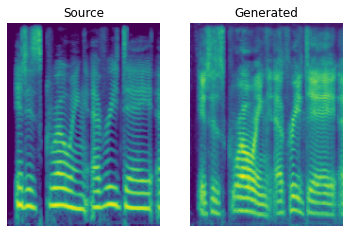

Mean D loss: 0.5153990387916565 Mean G loss: 0.5737771987915039 Mean ID loss: 0.1072145327925682
[Epoch 34/50] [Batch 0] [D loss f: 0.5224544405937195 r: 0.5158041715621948] [G loss: 0.5658356547355652] [ID loss: 0.1066388487815857] [LR: 0.0002]
[Epoch 34/50] [Batch 600] [D loss f: 0.5193297863006592 r: 0.528519868850708] [G loss: 0.6053965091705322] [ID loss: 0.10701560974121094] [LR: 0.0002]
[Epoch 34/50] [Batch 1200] [D loss f: 0.518859326839447 r: 0.526526153087616] [G loss: 0.5617519021034241] [ID loss: 0.10712144523859024] [LR: 0.0002]
[Epoch 34/50] [Batch 1800] [D loss f: 0.514234185218811 r: 0.5278527736663818] [G loss: 0.5698747038841248] [ID loss: 0.10709737241268158] [LR: 0.0002]
[Epoch 34/50] [Batch 2400] [D loss f: 0.5134658813476562 r: 0.5340391993522644] [G loss: 0.5602274537086487] [ID loss: 0.10689104348421097] [LR: 0.0002]
[Epoch 34/50] [Batch 3000] [D loss f: 0.5229008793830872 r: 0.5283372402191162] [G loss: 0.5935430526733398] [ID loss: 0.10677027702331543] [LR: 0.

  4%|▍         | 80/2000 [00:00<00:03, 556.60it/s, loss=0.00231, spectral_convergence=-6.12]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 561.40it/s, loss=0.000297, spectral_convergence=-33.9]


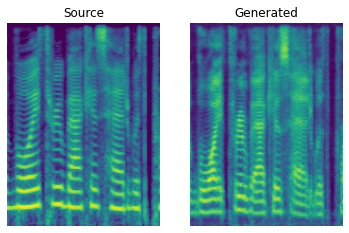

Mean D loss: 0.5160731077194214 Mean G loss: 0.5758616328239441 Mean ID loss: 0.10689394921064377
[Epoch 35/50] [Batch 0] [D loss f: 0.5281674265861511 r: 0.5180738568305969] [G loss: 0.5976795554161072] [ID loss: 0.10707636922597885] [LR: 0.0002]
[Epoch 35/50] [Batch 600] [D loss f: 0.5172010064125061 r: 0.5234306454658508] [G loss: 0.5769349932670593] [ID loss: 0.10696452111005783] [LR: 0.0002]
[Epoch 35/50] [Batch 1200] [D loss f: 0.5105711221694946 r: 0.5293705463409424] [G loss: 0.5896292328834534] [ID loss: 0.10648828744888306] [LR: 0.0002]
[Epoch 35/50] [Batch 1800] [D loss f: 0.5197750926017761 r: 0.520894467830658] [G loss: 0.5673511624336243] [ID loss: 0.10668183863162994] [LR: 0.0002]
[Epoch 35/50] [Batch 2400] [D loss f: 0.5092517733573914 r: 0.5343440771102905] [G loss: 0.5795368552207947] [ID loss: 0.10665684938430786] [LR: 0.0002]
[Epoch 35/50] [Batch 3000] [D loss f: 0.5203938484191895 r: 0.5270371437072754] [G loss: 0.5818296670913696] [ID loss: 0.10636024177074432] [L

  4%|▍         | 90/2000 [00:00<00:03, 579.15it/s, loss=0.00262, spectral_convergence=-8.46]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 579.10it/s, loss=0.000751, spectral_convergence=-25.4]


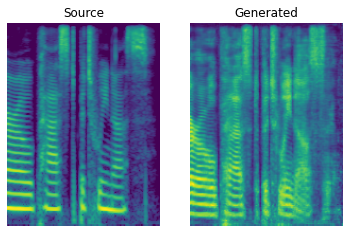

Mean D loss: 0.5155869126319885 Mean G loss: 0.586126983165741 Mean ID loss: 0.10661011189222336
[Epoch 36/50] [Batch 0] [D loss f: 0.5231958627700806 r: 0.5183336734771729] [G loss: 0.6453521847724915] [ID loss: 0.10623875260353088] [LR: 0.0002]
[Epoch 36/50] [Batch 600] [D loss f: 0.521695077419281 r: 0.5219658613204956] [G loss: 0.5692896246910095] [ID loss: 0.1066553071141243] [LR: 0.0002]
[Epoch 36/50] [Batch 1200] [D loss f: 0.5203859806060791 r: 0.5204532146453857] [G loss: 0.5618575215339661] [ID loss: 0.1065780445933342] [LR: 0.0002]
[Epoch 36/50] [Batch 1800] [D loss f: 0.5151083469390869 r: 0.520748496055603] [G loss: 0.5738591551780701] [ID loss: 0.1065441146492958] [LR: 0.0002]
[Epoch 36/50] [Batch 2400] [D loss f: 0.5155110955238342 r: 0.5223719477653503] [G loss: 0.6241804361343384] [ID loss: 0.1064806878566742] [LR: 0.0002]
[Epoch 36/50] [Batch 3000] [D loss f: 0.5160413384437561 r: 0.5287723541259766] [G loss: 0.6237954497337341] [ID loss: 0.10622256249189377] [LR: 0.0

  4%|▍         | 90/2000 [00:00<00:03, 596.81it/s, loss=0.00431, spectral_convergence=-8.06]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 569.12it/s, loss=0.000567, spectral_convergence=-27]


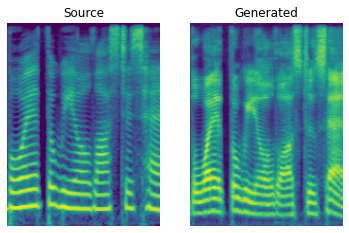

Mean D loss: 0.5135955214500427 Mean G loss: 0.5831701755523682 Mean ID loss: 0.10641083866357803
[Epoch 37/50] [Batch 0] [D loss f: 0.5108932852745056 r: 0.5404771566390991] [G loss: 0.5788013339042664] [ID loss: 0.10628165304660797] [LR: 0.0002]
[Epoch 37/50] [Batch 600] [D loss f: 0.5172498226165771 r: 0.5232746601104736] [G loss: 0.5743035674095154] [ID loss: 0.10634215921163559] [LR: 0.0002]
[Epoch 37/50] [Batch 1200] [D loss f: 0.5180919766426086 r: 0.5186804533004761] [G loss: 0.5698495507240295] [ID loss: 0.10610739141702652] [LR: 0.0002]
[Epoch 37/50] [Batch 1800] [D loss f: 0.5168382525444031 r: 0.5241953730583191] [G loss: 0.5763546228408813] [ID loss: 0.10639960318803787] [LR: 0.0002]
[Epoch 37/50] [Batch 2400] [D loss f: 0.5092552900314331 r: 0.5294579267501831] [G loss: 0.5674676895141602] [ID loss: 0.10659477114677429] [LR: 0.0002]
[Epoch 37/50] [Batch 3000] [D loss f: 0.5187669992446899 r: 0.523410975933075] [G loss: 0.628116250038147] [ID loss: 0.10574250668287277] [LR

  4%|▍         | 90/2000 [00:00<00:03, 584.24it/s, loss=0.00247, spectral_convergence=-8.31]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 579.90it/s, loss=0.000203, spectral_convergence=-31.7]


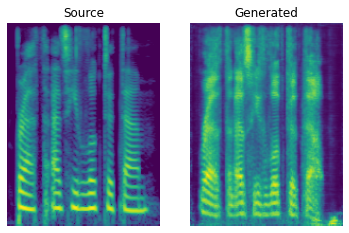

Mean D loss: 0.511966347694397 Mean G loss: 0.584725558757782 Mean ID loss: 0.10618560761213303
[Epoch 38/50] [Batch 0] [D loss f: 0.5124192237854004 r: 0.5187590718269348] [G loss: 0.5947030782699585] [ID loss: 0.10652986168861389] [LR: 0.0002]
[Epoch 38/50] [Batch 600] [D loss f: 0.5089014768600464 r: 0.5199747681617737] [G loss: 0.5993204712867737] [ID loss: 0.1063968688249588] [LR: 0.0002]
[Epoch 38/50] [Batch 1200] [D loss f: 0.5062397122383118 r: 0.5201902985572815] [G loss: 0.6033987998962402] [ID loss: 0.10584037005901337] [LR: 0.0002]
[Epoch 38/50] [Batch 1800] [D loss f: 0.5104987621307373 r: 0.5275099873542786] [G loss: 0.5783629417419434] [ID loss: 0.10578078031539917] [LR: 0.0002]
[Epoch 38/50] [Batch 2400] [D loss f: 0.5072411298751831 r: 0.5291049480438232] [G loss: 0.5736343264579773] [ID loss: 0.10594456642866135] [LR: 0.0002]
[Epoch 38/50] [Batch 3000] [D loss f: 0.5131223797798157 r: 0.5192744135856628] [G loss: 0.6029484272003174] [ID loss: 0.1057717353105545] [LR: 

  4%|▍         | 90/2000 [00:00<00:03, 586.70it/s, loss=0.00534, spectral_convergence=-7.22]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 564.72it/s, loss=0.000371, spectral_convergence=-34.6]


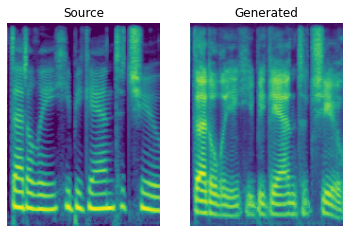

Mean D loss: 0.5107036828994751 Mean G loss: 0.5933822989463806 Mean ID loss: 0.10588724166154861
[Epoch 39/50] [Batch 0] [D loss f: 0.5182731747627258 r: 0.5104414224624634] [G loss: 0.6436419486999512] [ID loss: 0.10562398284673691] [LR: 0.0002]
[Epoch 39/50] [Batch 600] [D loss f: 0.5024274587631226 r: 0.5264968872070312] [G loss: 0.5973849296569824] [ID loss: 0.1054675281047821] [LR: 0.0002]
[Epoch 39/50] [Batch 1200] [D loss f: 0.5104376673698425 r: 0.516789436340332] [G loss: 0.5819910764694214] [ID loss: 0.10550558567047119] [LR: 0.0002]
[Epoch 39/50] [Batch 1800] [D loss f: 0.5130124092102051 r: 0.5189586281776428] [G loss: 0.5986326336860657] [ID loss: 0.10584759712219238] [LR: 0.0002]
[Epoch 39/50] [Batch 2400] [D loss f: 0.5094938278198242 r: 0.5241184234619141] [G loss: 0.5891650915145874] [ID loss: 0.10547307878732681] [LR: 0.0002]
[Epoch 39/50] [Batch 3000] [D loss f: 0.5123245120048523 r: 0.5280282497406006] [G loss: 0.582533597946167] [ID loss: 0.10522108525037766] [LR:

  4%|▍         | 90/2000 [00:00<00:03, 599.39it/s, loss=0.00517, spectral_convergence=-10.2]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 575.63it/s, loss=0.000227, spectral_convergence=-46.3]


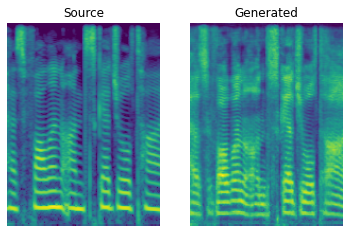

Mean D loss: 0.5087581276893616 Mean G loss: 0.5857699513435364 Mean ID loss: 0.10543099790811539
[Epoch 40/50] [Batch 0] [D loss f: 0.5133842825889587 r: 0.5284498333930969] [G loss: 0.624735414981842] [ID loss: 0.10532078891992569] [LR: 0.0002]
[Epoch 40/50] [Batch 600] [D loss f: 0.4979677200317383 r: 0.5294673442840576] [G loss: 0.5579132437705994] [ID loss: 0.10510905832052231] [LR: 0.0002]
[Epoch 40/50] [Batch 1200] [D loss f: 0.5042171478271484 r: 0.5257682204246521] [G loss: 0.5708175301551819] [ID loss: 0.10555535554885864] [LR: 0.0002]
[Epoch 40/50] [Batch 1800] [D loss f: 0.5067574977874756 r: 0.5221330523490906] [G loss: 0.5873247385025024] [ID loss: 0.10555600374937057] [LR: 0.0002]
[Epoch 40/50] [Batch 2400] [D loss f: 0.5071964263916016 r: 0.5213544964790344] [G loss: 0.5878777503967285] [ID loss: 0.10522307455539703] [LR: 0.0002]
[Epoch 40/50] [Batch 3000] [D loss f: 0.508689284324646 r: 0.5272364020347595] [G loss: 0.5536782741546631] [ID loss: 0.10603679716587067] [LR

  4%|▍         | 90/2000 [00:00<00:03, 568.35it/s, loss=0.00765, spectral_convergence=-7.65]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 568.10it/s, loss=0.00077, spectral_convergence=-31.5]


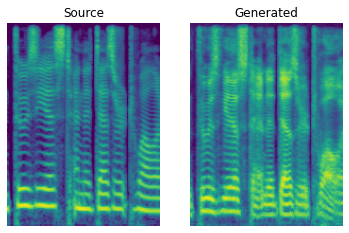

Mean D loss: 0.5077305436134338 Mean G loss: 0.5860863327980042 Mean ID loss: 0.10530027002096176
[Epoch 41/50] [Batch 0] [D loss f: 0.5088929533958435 r: 0.5129141211509705] [G loss: 0.5666033625602722] [ID loss: 0.10479564964771271] [LR: 0.0002]
[Epoch 41/50] [Batch 600] [D loss f: 0.503344714641571 r: 0.5172064304351807] [G loss: 0.5961946845054626] [ID loss: 0.10497258603572845] [LR: 0.0002]
[Epoch 41/50] [Batch 1200] [D loss f: 0.5013131499290466 r: 0.5216482281684875] [G loss: 0.5865316987037659] [ID loss: 0.10465871542692184] [LR: 0.0002]
[Epoch 41/50] [Batch 1800] [D loss f: 0.5096656680107117 r: 0.5224987268447876] [G loss: 0.5986080765724182] [ID loss: 0.10481858253479004] [LR: 0.0002]
[Epoch 41/50] [Batch 2400] [D loss f: 0.5159383416175842 r: 0.5089514255523682] [G loss: 0.5880131721496582] [ID loss: 0.10518286377191544] [LR: 0.0002]
[Epoch 41/50] [Batch 3000] [D loss f: 0.5066030025482178 r: 0.5105278491973877] [G loss: 0.6115666627883911] [ID loss: 0.10506965965032578] [L

  4%|▍         | 90/2000 [00:00<00:03, 586.81it/s, loss=0.00533, spectral_convergence=-9.26]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 574.90it/s, loss=0.000925, spectral_convergence=-26.3]


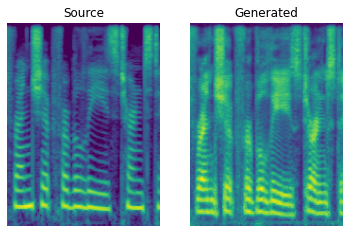

Mean D loss: 0.5066299438476562 Mean G loss: 0.5839477181434631 Mean ID loss: 0.10493256151676178
[Epoch 42/50] [Batch 0] [D loss f: 0.5041930079460144 r: 0.523598849773407] [G loss: 0.5581662654876709] [ID loss: 0.10537077486515045] [LR: 0.0002]
[Epoch 42/50] [Batch 600] [D loss f: 0.5105254054069519 r: 0.517934262752533] [G loss: 0.5900822877883911] [ID loss: 0.1045178547501564] [LR: 0.0002]
[Epoch 42/50] [Batch 1200] [D loss f: 0.49943894147872925 r: 0.518257200717926] [G loss: 0.5966773629188538] [ID loss: 0.1046728789806366] [LR: 0.0002]
[Epoch 42/50] [Batch 1800] [D loss f: 0.5044513940811157 r: 0.5194277763366699] [G loss: 0.5431810617446899] [ID loss: 0.10470502078533173] [LR: 0.0002]
[Epoch 42/50] [Batch 2400] [D loss f: 0.4995286166667938 r: 0.5215165019035339] [G loss: 0.5670765042304993] [ID loss: 0.104636549949646] [LR: 0.0002]
[Epoch 42/50] [Batch 3000] [D loss f: 0.5028977990150452 r: 0.5230516791343689] [G loss: 0.5873118042945862] [ID loss: 0.1044994369149208] [LR: 0.0

  4%|▍         | 90/2000 [00:00<00:03, 556.03it/s, loss=0.00629, spectral_convergence=-9.6] 

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 574.88it/s, loss=0.0022, spectral_convergence=-13.9]


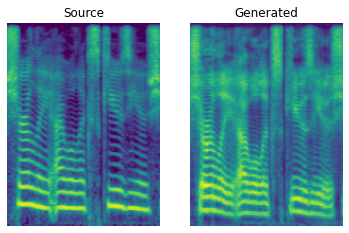

Mean D loss: 0.5035281181335449 Mean G loss: 0.5751664638519287 Mean ID loss: 0.10469239950180054
[Epoch 43/50] [Batch 0] [D loss f: 0.508686900138855 r: 0.5267852544784546] [G loss: 0.5837624073028564] [ID loss: 0.10494296252727509] [LR: 0.0002]
[Epoch 43/50] [Batch 600] [D loss f: 0.5039154291152954 r: 0.5191444158554077] [G loss: 0.5876145362854004] [ID loss: 0.1044175997376442] [LR: 0.0002]
[Epoch 43/50] [Batch 1200] [D loss f: 0.50165194272995 r: 0.5159793496131897] [G loss: 0.5704856514930725] [ID loss: 0.10485991090536118] [LR: 0.0002]
[Epoch 43/50] [Batch 1800] [D loss f: 0.5044564008712769 r: 0.5187129974365234] [G loss: 0.6131892800331116] [ID loss: 0.10443063080310822] [LR: 0.0002]
[Epoch 43/50] [Batch 2400] [D loss f: 0.5097507834434509 r: 0.5132868885993958] [G loss: 0.5653918385505676] [ID loss: 0.10436966270208359] [LR: 0.0002]
[Epoch 43/50] [Batch 3000] [D loss f: 0.512054979801178 r: 0.5146621465682983] [G loss: 0.5642446875572205] [ID loss: 0.10453147441148758] [LR: 0

  4%|▍         | 90/2000 [00:00<00:03, 577.97it/s, loss=0.00412, spectral_convergence=-9.85]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 578.13it/s, loss=0.000323, spectral_convergence=-38.2]


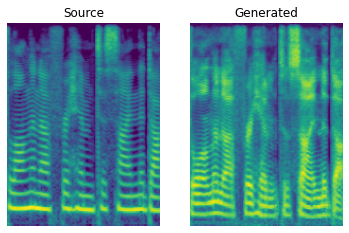

Mean D loss: 0.5065107345581055 Mean G loss: 0.581470787525177 Mean ID loss: 0.10425549000501633
[Epoch 44/50] [Batch 0] [D loss f: 0.5053249597549438 r: 0.5111737251281738] [G loss: 0.6103915572166443] [ID loss: 0.10369275510311127] [LR: 0.0002]
[Epoch 44/50] [Batch 600] [D loss f: 0.5070963501930237 r: 0.5183725953102112] [G loss: 0.5684608817100525] [ID loss: 0.10424572974443436] [LR: 0.0002]
[Epoch 44/50] [Batch 1200] [D loss f: 0.5092527270317078 r: 0.5081511735916138] [G loss: 0.5583889484405518] [ID loss: 0.10426834225654602] [LR: 0.0002]
[Epoch 44/50] [Batch 1800] [D loss f: 0.5098503828048706 r: 0.5089593529701233] [G loss: 0.5995529890060425] [ID loss: 0.10415872931480408] [LR: 0.0002]
[Epoch 44/50] [Batch 2400] [D loss f: 0.50685054063797 r: 0.5141019821166992] [G loss: 0.552964448928833] [ID loss: 0.10442576557397842] [LR: 0.0002]
[Epoch 44/50] [Batch 3000] [D loss f: 0.5142543315887451 r: 0.5107715725898743] [G loss: 0.5766797065734863] [ID loss: 0.104050412774086] [LR: 0.

  4%|▍         | 90/2000 [00:00<00:03, 577.17it/s, loss=0.00467, spectral_convergence=-7.5] 

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 569.23it/s, loss=0.00019, spectral_convergence=-50.5]


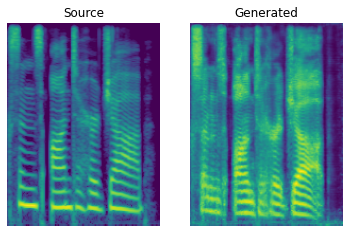

Mean D loss: 0.5047947764396667 Mean G loss: 0.5802710652351379 Mean ID loss: 0.10409622639417648
[Epoch 45/50] [Batch 0] [D loss f: 0.49772369861602783 r: 0.5121208429336548] [G loss: 0.578616738319397] [ID loss: 0.10430258512496948] [LR: 0.0002]
[Epoch 45/50] [Batch 600] [D loss f: 0.5001766681671143 r: 0.5092736482620239] [G loss: 0.5849397778511047] [ID loss: 0.10393431037664413] [LR: 0.0002]
[Epoch 45/50] [Batch 1200] [D loss f: 0.4994640052318573 r: 0.5212635397911072] [G loss: 0.6121940612792969] [ID loss: 0.10380581766366959] [LR: 0.0002]
[Epoch 45/50] [Batch 1800] [D loss f: 0.5038453340530396 r: 0.5135732293128967] [G loss: 0.6042466163635254] [ID loss: 0.10428101569414139] [LR: 0.0002]
[Epoch 45/50] [Batch 2400] [D loss f: 0.5016593933105469 r: 0.5122849941253662] [G loss: 0.5932751297950745] [ID loss: 0.10356701910495758] [LR: 0.0002]
[Epoch 45/50] [Batch 3000] [D loss f: 0.502480149269104 r: 0.5159837007522583] [G loss: 0.5864274501800537] [ID loss: 0.1037731021642685] [LR

  4%|▍         | 90/2000 [00:00<00:03, 595.98it/s, loss=0.00265, spectral_convergence=-9.9] 

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 577.46it/s, loss=0.00014, spectral_convergence=-45.1]


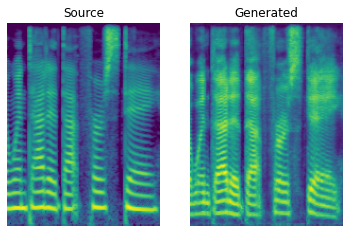

Mean D loss: 0.5028792023658752 Mean G loss: 0.5895701050758362 Mean ID loss: 0.10388390719890594
[Epoch 46/50] [Batch 0] [D loss f: 0.5127884149551392 r: 0.5079776048660278] [G loss: 0.5950988531112671] [ID loss: 0.10384621471166611] [LR: 0.0002]
[Epoch 46/50] [Batch 600] [D loss f: 0.49768564105033875 r: 0.5199901461601257] [G loss: 0.5900076031684875] [ID loss: 0.10363384336233139] [LR: 0.0002]
[Epoch 46/50] [Batch 1200] [D loss f: 0.5024179220199585 r: 0.5084133148193359] [G loss: 0.6178983449935913] [ID loss: 0.10356080532073975] [LR: 0.0002]
[Epoch 46/50] [Batch 1800] [D loss f: 0.4972115457057953 r: 0.5183190703392029] [G loss: 0.5878665447235107] [ID loss: 0.10363965481519699] [LR: 0.0002]
[Epoch 46/50] [Batch 2400] [D loss f: 0.5026921033859253 r: 0.5091228485107422] [G loss: 0.5519726872444153] [ID loss: 0.1038876324892044] [LR: 0.0002]
[Epoch 46/50] [Batch 3000] [D loss f: 0.5024301409721375 r: 0.5167047381401062] [G loss: 0.5913487672805786] [ID loss: 0.10394597053527832] [

  4%|▍         | 90/2000 [00:00<00:03, 606.35it/s, loss=0.00517, spectral_convergence=-8.37]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 573.05it/s, loss=0.000598, spectral_convergence=-27.6]


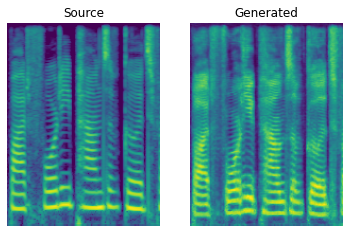

Mean D loss: 0.5006104111671448 Mean G loss: 0.5867692232131958 Mean ID loss: 0.10365185141563416
[Epoch 47/50] [Batch 0] [D loss f: 0.5157152414321899 r: 0.5110093951225281] [G loss: 0.5788925886154175] [ID loss: 0.10399418324232101] [LR: 0.0002]
[Epoch 47/50] [Batch 600] [D loss f: 0.5030710101127625 r: 0.5141427516937256] [G loss: 0.5518455505371094] [ID loss: 0.10346804559230804] [LR: 0.0002]
[Epoch 47/50] [Batch 1200] [D loss f: 0.4960860311985016 r: 0.5190092921257019] [G loss: 0.5875349640846252] [ID loss: 0.10351532697677612] [LR: 0.0002]
[Epoch 47/50] [Batch 1800] [D loss f: 0.49705758690834045 r: 0.5140435099601746] [G loss: 0.5716994404792786] [ID loss: 0.1036376953125] [LR: 0.0002]
[Epoch 47/50] [Batch 2400] [D loss f: 0.49813786149024963 r: 0.5209578275680542] [G loss: 0.5761356353759766] [ID loss: 0.10330642014741898] [LR: 0.0002]
[Epoch 47/50] [Batch 3000] [D loss f: 0.5041767358779907 r: 0.5122122168540955] [G loss: 0.5859168767929077] [ID loss: 0.10341903567314148] [LR

  4%|▍         | 90/2000 [00:00<00:03, 557.11it/s, loss=0.00374, spectral_convergence=-7.05]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 575.90it/s, loss=9.91e-5, spectral_convergence=-54.1]


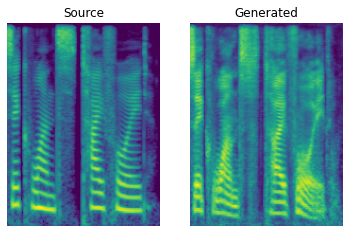

Mean D loss: 0.49992382526397705 Mean G loss: 0.5809794664382935 Mean ID loss: 0.10355525463819504
[Epoch 48/50] [Batch 0] [D loss f: 0.5047460198402405 r: 0.5034329295158386] [G loss: 0.5550605654716492] [ID loss: 0.10355863720178604] [LR: 0.0002]
[Epoch 48/50] [Batch 600] [D loss f: 0.4993976950645447 r: 0.5133567452430725] [G loss: 0.5773082375526428] [ID loss: 0.10340528190135956] [LR: 0.0002]
[Epoch 48/50] [Batch 1200] [D loss f: 0.5014563202857971 r: 0.5168904662132263] [G loss: 0.5973711609840393] [ID loss: 0.10332807898521423] [LR: 0.0002]
[Epoch 48/50] [Batch 1800] [D loss f: 0.4913431406021118 r: 0.5160207152366638] [G loss: 0.5550901889801025] [ID loss: 0.10328547656536102] [LR: 0.0002]
[Epoch 48/50] [Batch 2400] [D loss f: 0.49861037731170654 r: 0.5134279727935791] [G loss: 0.5942021608352661] [ID loss: 0.10373162478208542] [LR: 0.0002]
[Epoch 48/50] [Batch 3000] [D loss f: 0.5049415230751038 r: 0.5132232904434204] [G loss: 0.561886191368103] [ID loss: 0.10356882959604263] 

  4%|▍         | 90/2000 [00:00<00:03, 580.71it/s, loss=0.00514, spectral_convergence=-6.32]

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 579.35it/s, loss=0.00161, spectral_convergence=-19.7]


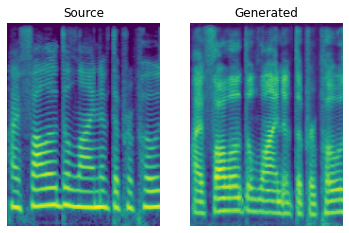

Mean D loss: 0.5002580285072327 Mean G loss: 0.5776315331459045 Mean ID loss: 0.10339906811714172
[Epoch 49/50] [Batch 0] [D loss f: 0.5099596381187439 r: 0.49449819326400757] [G loss: 0.5483835935592651] [ID loss: 0.10345988720655441] [LR: 0.0002]
[Epoch 49/50] [Batch 600] [D loss f: 0.4952290952205658 r: 0.5139737725257874] [G loss: 0.5743635892868042] [ID loss: 0.10362093895673752] [LR: 0.0002]
[Epoch 49/50] [Batch 1200] [D loss f: 0.49388331174850464 r: 0.5082314014434814] [G loss: 0.5761845111846924] [ID loss: 0.10332202911376953] [LR: 0.0002]
[Epoch 49/50] [Batch 1800] [D loss f: 0.49685171246528625 r: 0.5179460644721985] [G loss: 0.5795487761497498] [ID loss: 0.10367882996797562] [LR: 0.0002]
[Epoch 49/50] [Batch 2400] [D loss f: 0.5025348663330078 r: 0.5085500478744507] [G loss: 0.6098828911781311] [ID loss: 0.1032654419541359] [LR: 0.0002]
[Epoch 49/50] [Batch 3000] [D loss f: 0.4979425072669983 r: 0.509747326374054] [G loss: 0.5492919087409973] [ID loss: 0.1032867282629013] [

  4%|▍         | 90/2000 [00:00<00:03, 576.85it/s, loss=0.0043, spectral_convergence=-9.86] 

(6, 192, 24, 1)


100%|██████████| 2000/2000 [00:03<00:00, 572.32it/s, loss=0.000716, spectral_convergence=-25.8]


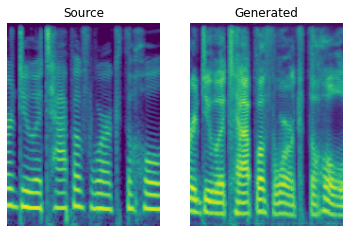

Mean D loss: 0.49895647168159485 Mean G loss: 0.5831555724143982 Mean ID loss: 0.1031644269824028


In [ ]:
#Training

#n_save = how many epochs between each saving and displaying of results
#gupt = how many discriminator updates for generator+siamese update

train(50, batch_size=bs, lr=0.0002, n_save=1, gupt=3)

In [ ]:
#After Training, use these functions to convert data with the generator and save the results

#Assembling generated Spectrogram chunks into final Spectrogram
def specass(a,spec):
  but=False
  con = np.array([])
  nim = a.shape[0]
  for i in range(nim-1):
    im = a[i]
    im = np.squeeze(im)
    if not but:
      con=im
      but=True
    else:
      con = np.concatenate((con,im), axis=1)
  diff = spec.shape[1]-(nim*shape)
  a = np.squeeze(a)
  con = np.concatenate((con,a[-1,:,-diff:]), axis=1)
  return np.squeeze(con)

#Splitting input spectrogram into different chunks to feed to the generator
def chopspec(spec):
  dsa=[]
  for i in range(spec.shape[1]//shape):
    im = spec[:,i*shape:i*shape+shape]
    im = np.reshape(im, (im.shape[0],im.shape[1],1))
    dsa.append(im)
  imlast = spec[:,-shape:]
  imlast = np.reshape(imlast, (imlast.shape[0],imlast.shape[1],1))
  dsa.append(imlast)
  return np.array(dsa, dtype=np.float32)

#Converting from source Spectrogram to target Spectrogram
def towave(spec, name, path='../content/', show=False):
  specarr = chopspec(spec)
  print(specarr.shape)
  a = specarr
  print('Generating...')
  ab = gen(a, training=False)
  print('Assembling and Converting...')
  a = specass(a,spec)
  ab = specass(ab,spec)
  awv = deprep(a)
  abwv = deprep(ab)
  print('Saving...')
  pathfin = f'{path}/{name}'
  os.mkdir(pathfin)
  sf.write(pathfin+'/AB.wav', abwv, sr)
  sf.write(pathfin+'/A.wav', awv, sr)
  print('Saved WAV!')
  IPython.display.display(IPython.display.Audio(np.squeeze(abwv), rate=sr))
  IPython.display.display(IPython.display.Audio(np.squeeze(awv), rate=sr))
  if show:
    fig, axs = plt.subplots(ncols=2)
    axs[0].imshow(np.flip(a, -2), cmap=None)
    axs[0].axis('off')
    axs[0].set_title('Source')
    axs[1].imshow(np.flip(ab, -2), cmap=None)
    axs[1].axis('off')
    axs[1].set_title('Generated')
    plt.show()
  return abwv

(983342,)


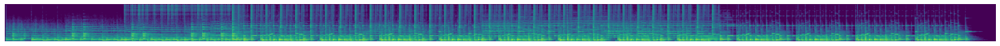

(214, 192, 24, 1)
Generating...
Assembling and Converting...


100%|██████████| 2000/2000 [00:09<00:00, 204.80it/s, loss=0.00144, spectral_convergence=-9.4]


Saving...
Saved WAV!


In [ ]:
#Wav to wav conversion

wv, sr = librosa.load(librosa.util.example_audio_file(), sr=16000)  #Load waveform
print(wv.shape)
speca = prep(wv)                                                    #Waveform to Spectrogram

plt.figure(figsize=(50,1))                                          #Show Spectrogram
plt.imshow(np.flip(speca, axis=0), cmap=None)
plt.axis('off')
plt.show()

abwv = towave(speca, name='FILENAME1', path='../content/')           #Convert and save wav